# Introduction
## Macroeconomic Factor Model Project

### Motivations:
Inspired by [Two Sigma Factor Lens](https://www.twosigma.com/articles/thematic-research-introducing-the-two-sigma-factor-lens), which models broad macro risk drivers to reduce correlation and improve portfolio construction. The paper uses tradeable proxies to enable a portfolio construction from the factor model. However, my approach will be slightly different.


### Project goals:
Build a factor model to represent major US macro risks. Use it to detect market regimes for better trading signals. Market regimes are purely statistical methods to identify whether or not we are in a BULL / BEAR / SIDEWAYS market. Perhaps there are more than these regimes in the market, we will explore this after we have constructed our factor model. 
#####
### Factor Structure:
- Core Factors: Dominant macro drivers explaining most variance across asset classes. 
- Secondary Factors: Specialized risks with smaller, but still meaningful, influence.


| Factor            | Type       | Proxy Ticker(s) | Description                                | Inception Date |
|-------------------|------------|-----------------|--------------------------------------------|----------------|
| US Equity (Target)| Core       | SPY             | S&P 500 ETF                                | 1993           |
| Interest Rates    | Core       | IEF             | 7–10 Year US Treasury Bonds                | 2002           |
| Credit            | Core       | LQD, HYG        | IG & High Yield Credit                     | 2002 / 2007    |
| Commodities       | Core       | DBC             | Broad Commodities Index ETF                | 2006           |
| USD FX Strength   | Secondary  | UUP             | US Dollar Index ETF                        | 2007           |
| Local Inflation   | Secondary  | TIP             | US TIPS ETF                                | 2003           |


### Factor motivations : 
- US Equity: The dependent variable, we want to predict regimes inside this proxy, so this factor will be used as reference.
- We are using the other factors to interpret SPY's behaviour - this will become apparent in the correlation analysis

Note: Our data must begin in 2007 due to the inception of our UUP and HYG proxies, unfortunately I was not able to find any data which would provide a representation of these factors with an earlier date. 

Correlated factors like Credit or Commodities will be residualized against Equity/Interest Rates to isolate pure exposures using simple regression models. 

### Methodology - Why a simple regression Model?

I will not be using any more complex models such as ARIMA, SARIMAX, LSTM, Ridge, Lasso, Elastic Net, etc. This is because our goal is not to capture variance using the model, but instead extract the residuals from each regression we do. 

In laymans terms, we are not looking to predict with this model, instead we are looking to explain.

By design this means we are technically violating Gauss-Markov assumptions as we are purposefully looking for exogenity, so that we can extract it. This would mean our residual extraction will have noise in it, but I am assuming the noise is negligible. Anyways on financial time-series, we find that the assumptions are generally violated anyways, we will almost definitely have heteroskedastic residuals and depending on the data we use, we will probably have serial correlation. 

## Data Ingestion

I am taking the selected tickers mentioned above as our targets to begin factor modeling. I am considering using 5 day returns to smooth out some noise we may have in our data, problem is we will introduce multicollinearity by design if we do this.  

In [103]:
import yfinance as yf
import pandas as pd



# Getting Tickers
tickers = ['SPY','IEF', 'LQD', 'HYG', 'DBC', 'UUP', 'TIP','^VIX'] 




# Renaming Tickers to factor names for ease of comprehension
factor_map = {
    'SPY': 'US Equity',
    'IEF': 'Interest Rates',
    'LQD': 'IG Credit',
    'HYG': 'HY Credit',
    'DBC': 'Commodities',
    'UUP': 'USD FX Strength',
    'TIP': 'Local Inflation'
}





# Getting clean price and computing 1d returns as rets_1d into a dataframe
px = yf.download(tickers, start="2007-01-01", auto_adjust=True, progress=False)['Close'].dropna().sort_index()



px = px.rename(columns=factor_map)



# 1 Day Returns (in case we need them)
rets_1d = px.pct_change().dropna()
rets_1d = rets_1d.drop(columns='^VIX')
# Getting 5 day returns to reduce noise
rets_5d = px.pct_change(5).dropna()
rets_5d = rets_5d.drop(columns='^VIX')




### Ensuring indices are consistent
rets_1d = rets_1d.loc[rets_5d.index]

rets_1d.head(3)

Ticker,Commodities,HY Credit,Interest Rates,IG Credit,US Equity,Local Inflation,USD FX Strength
Date,,,,,,,
2007-04-18,0.000396,0.000288,0.002294,0.000281,0.001224,0.003289,-0.001221
2007-04-19,-0.002772,0.003456,-0.000119,0.000654,-0.000271,-0.000497,0.000000
2007-04-20,0.013900,-0.000574,-0.001086,-0.000280,0.009441,0.000399,-0.003666


Note : 5 day returns will cause autocorrelation because 5 day windows share daily returns. This violates Gauss-Markov assumptions of classical OLS. I will prove this by comparing the 5D returns to the daily returns. 

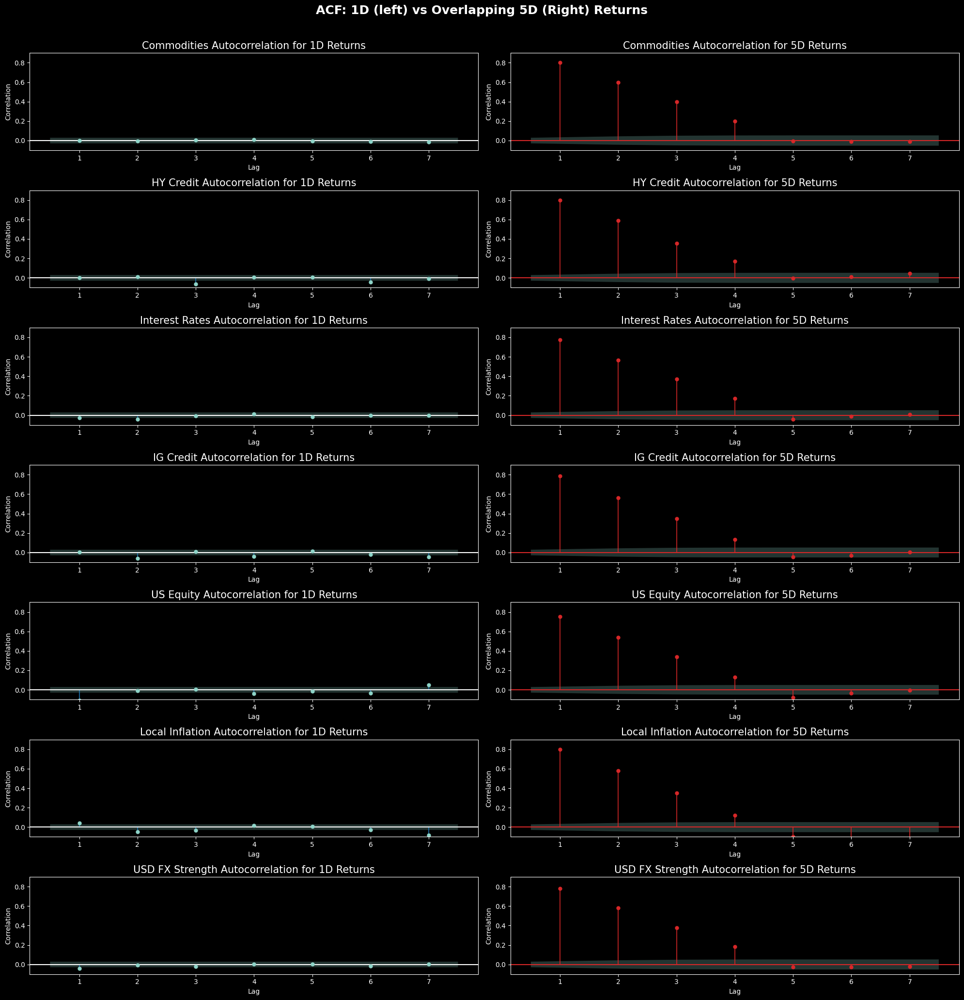

In [104]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt


cols = rets_5d.columns




fig, axes = plt.subplots(nrows=len(cols), ncols=2, figsize=(20,len(cols)*3))

fig.suptitle('ACF: 1D (left) vs Overlapping 5D (Right) Returns',fontsize=18,fontweight='bold')
for i, col in enumerate(cols):


    ### 1 Day Autocorrelation Plot
    plot_acf(rets_1d[col], lags=7, ax=axes[i,0],vlines_kwargs={'color':'tab:blue','alpha':0.8},zero=False)
    axes[i,0].set_ylim(-0.1,0.9)
    axes[i,0].set_title(f'{col} Autocorrelation for 1D Returns',fontsize=15)
    axes[i,0].set_xlabel('Lag')
    axes[i,0].set_ylabel('Correlation')
    
    
    ### 5 Day Autocorrelation Plot
    plot_acf(rets_5d[col], lags=7, ax=axes[i,1], color=('tab:red'),vlines_kwargs={'color':'tab:red','alpha':0.8},zero=False)
    axes[i,1].set_ylim(-0.1,0.9)
    axes[i,1].set_title(f'{col} Autocorrelation for 5D Returns',fontsize=15)
    axes[i,1].set_xlabel('Lag')
    axes[i,1].set_ylabel('Correlation')

plt.tight_layout(rect=[0,0,1,0.97])
plt.show()

By Gauss-Markov, OLS is BLUE if errors are homoskedastic and uncorrelated. Here we see overlapping returns cause serial correlation and financial data, generally speaking, is heteroskedastic due to regime changes adjusting volatility across time. 
######
As a result, we can use OLS, but our interpretation will not be as useful. To remedy this, I am considering applying Newey-West HAC adjustments in order to make the covariance matrix consistent under these violations.  

For this analysis we will discontinue using 5-day returns, but acknowledge they could be useful for noise reduction purposes. 

In [105]:
del rets_5d

## Data Exploration

When we look at SPY across our dataset we can see that there are particular moments in the time-series which exhibit different behaviors. This serves as basic evidence that market regimes exist. Notably, we can see at times when ^VIX is high, there tends to be dips in price. These are also typically times of recession or economic crises. Also look at how other factors interact during these periods, and also in other periods, hopefully our model will be able to explain this.

##### NOTE: I used log price to normalize the prices to get a simple insight into how these prices behave with each other in different states comparatively. We will not be using log transformations for the actual model as it could be unrealistic

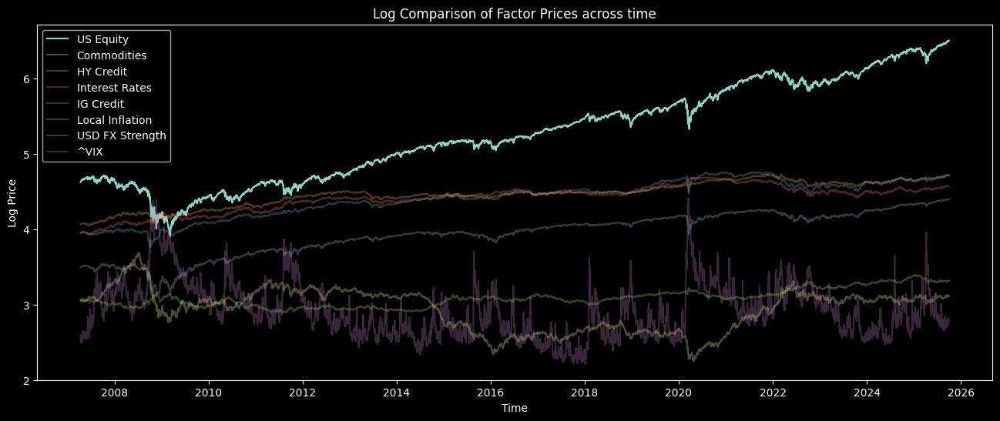

In [106]:
import numpy as np


plt.figure(figsize=(16,6))
plt.plot(np.log(px['US Equity']),label='US Equity')

for col in px.drop('US Equity', axis=1).columns:
    plt.plot(np.log(px[col],), alpha=0.3, label=col)

plt.legend()
plt.xlabel('Time')
plt.ylabel('Log Price')
plt.title('Log Comparison of Factor Prices across time')
plt.show()

## Correlation Analysis
The absolute correlation between several factors can demonstrate the need for residualization.This step will orthogonalize exposures ensuring cleaner independent features for regime modeling. If our factors our correlated then they will not be as insightful when selecting the regime as it implies that some regimes are co-dependent.  

#####
Note that the these correlations are of the overall dataset, and total time period, but we have some interesting observations:
- Credit Splits: IG Credit aligns more with rates and inflation, HY credit more with US Equities. HY and IG credit also move together
- USD FX strength shows negative relationships, making it a potential diversifier

<Figure size 800x600 with 0 Axes>

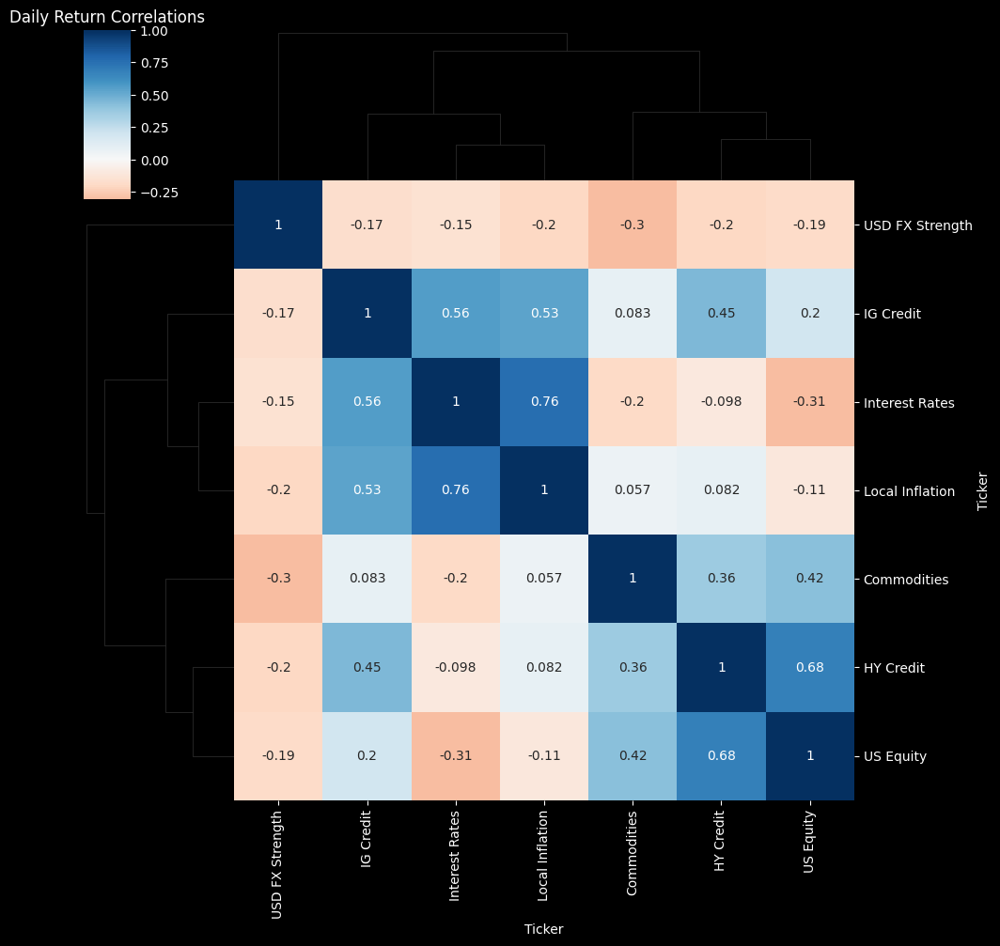

In [107]:
import seaborn as sns


plt.figure(figsize=(8,6))
sns.clustermap(rets_1d.corr(), cmap='RdBu', center=0,annot=True)
plt.title("Daily Return Correlations")
plt.show()


Given that these correlations evolve across time, the residualization process should also adapt, fortifying the reasoning behind using a rolling component in the regression to reflect the market environment at every point in time



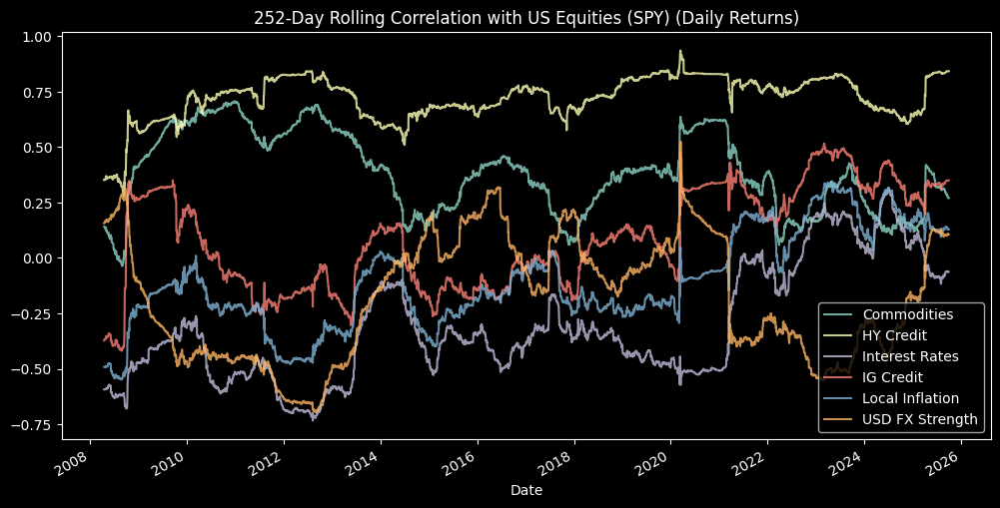

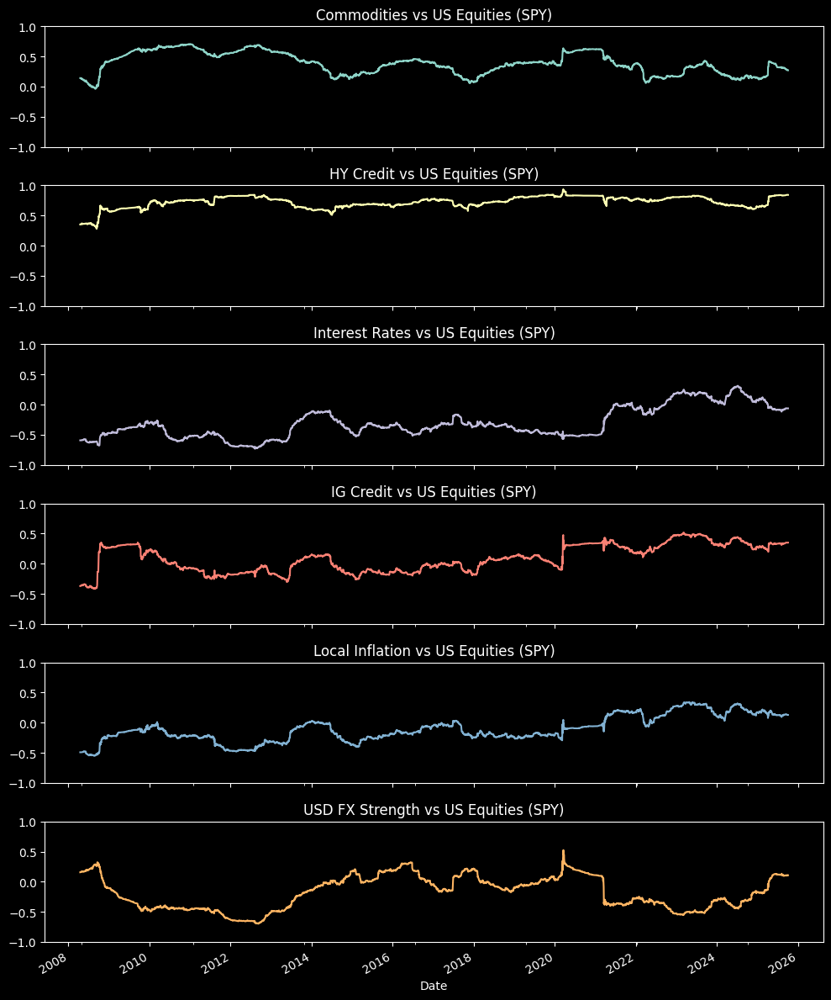

In [108]:

window = 252
roll_corrs = rets_1d.rolling(window).corr(rets_1d['US Equity'])

# Get default color cycle
color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
color_map = {col: color_cycle[i % len(color_cycle)] 
             for i, col in enumerate(rets_1d.columns.drop('US Equity'))}

# Combined plot
plt.figure(figsize=(12,6))
for col in rets_1d.columns.drop('US Equity'):
    roll_corrs.loc[:, col].plot(label=col, alpha=0.8, color=color_map[col])
plt.title(f"{window}-Day Rolling Correlation with US Equities (SPY) (Daily Returns)")
plt.legend()
plt.show()

# Faceted plot to see individual behavior
fig, axes = plt.subplots(len(rets_1d.columns)-1, 1, figsize=(10,12), sharex=True)
for ax, col in zip(axes, rets_1d.columns.drop('US Equity')):
    roll_corrs.loc[:, col].plot(ax=ax, color=color_map[col])
    ax.set_title(f"{col} vs US Equities (SPY)")
    ax.set_ylim(-1, 1)
plt.tight_layout()
plt.show()


Correlations are not static. They can drift from being positively related, to not related, or in extreme cases, correlations can even shift from being positive to negative! Perhaps in situations like these we are noticing regime shifts. 
##### 
One can imagine if we were to accumulate and mash these all together and let the model decide where the regimes are that these shifts in correlations could have a direct impact on determining regimes. 

Because of this, at the end of the project I will save the raw returns as a potential feature set in the regime model

## Factor Residualization - Regression Model Dev
##### 
Given that our data begins in 2007, we cannot directly follow the paper here. The data I have available is not as vast as what was available to the authors, I have had to find and use alternative methods to ensure that my model has a sufficient fit and can produce a similar effect. To begin designing the model, we discussed using an expionential weight which would give more weight to recent data.

This is useful in our application because we are looking to model market regime states. An EW component will allow the model to retain 'memory' of local conditions, but in a way which prioritizes the most recent information.  


## EW Component 

We are implementing the weighting scheme via a half-life decay function. The function is intuitive because it specifies the point in the past at which the influence of observations is reduced to half the influence of the present. 

#### To calculate this: 


We define the decay factor $\delta$ using the half-life condition where $hl$ is the half-llfe parameter:

$$
\delta^{hl} = \tfrac{1}{2}.
$$

Taking logs:

$$
hl \cdot \ln(\delta) = \ln\!\left(\tfrac{1}{2}\right),
$$

Which implies:

$$
\ln(\delta) = \frac{\ln(1/2)}{hl}, \quad \delta = \exp\!\left(\tfrac{\ln(1/2)}{hl}\right).
$$

Given a rolling window of length $j$, we assign weights to each observation according to its age, measured backwards from the present:

$$
w_{age} = \delta^{age}, \quad age = 0,1,\dots,j-1,
$$

I have tied the decay function to the regression window to ensure that they adapt together and for better interpretability (half-life is half the window'). Once we get the decay factor we need to generate weights and normalize them

In [109]:
def exp_weights(j, alpha=0.5):    
    hl = j * alpha
    delta = np.exp((np.log(0.5))/(hl))

    # generating ages from 0 to j-1
    ages = np.arange(j-1,-1,-1)
    raw_weight = delta**ages
    # Ensuring weights add to 1
    weights = raw_weight / raw_weight.sum()
    return weights            


##### These raw weights are normalized so they sum to one. This means by construction, the most recent observation recieves the highest weight, while the influence of older observations decay exponentially.

In [110]:
# Proof of functional weighting comoponent

print('Array of weights: ')
print(exp_weights(100))
print('Sum of weights: ', exp_weights(100).sum())

Array of weights: 
[0.00465316 0.00471812 0.00478398 0.00485076 0.00491847 0.00498713
 0.00505675 0.00512734 0.00519892 0.00527149 0.00534508 0.00541969
 0.00549535 0.00557206 0.00564984 0.00572871 0.00580868 0.00588977
 0.00597199 0.00605535 0.00613988 0.00622559 0.0063125  0.00640062
 0.00648997 0.00658056 0.00667242 0.00676557 0.00686001 0.00695577
 0.00705287 0.00715133 0.00725115 0.00735238 0.00745501 0.00755908
 0.0076646  0.0077716  0.00788008 0.00799008 0.00810162 0.00821472
 0.00832939 0.00844566 0.00856356 0.0086831  0.00880432 0.00892722
 0.00905184 0.0091782  0.00930632 0.00943623 0.00956796 0.00970152
 0.00983695 0.00997427 0.0101135  0.01025468 0.01039783 0.01054298
 0.01069015 0.01083938 0.0109907  0.01114412 0.01129969 0.01145742
 0.01161736 0.01177954 0.01194397 0.0121107  0.01227976 0.01245118
 0.01262499 0.01280123 0.01297993 0.01316112 0.01334485 0.01353113
 0.01372002 0.01391155 0.01410574 0.01430265 0.01450231 0.01470475
 0.01491003 0.01511816 0.0153292  0.0155431

## Rolling Regression Function


This is a lot of code, and is somewhat difficult to understand. It actually took me forever to figure this out! 

I will walk through what is going on in detail with a TD;DR section to summarize.

### TL;DR
- We run a Exponentially Weighted 60-day rolling regression for each factor, where we set y as the factor we wish to residualize, and all other factors we have are our X values.
- We store betas, $R^2$, SEs, t-stats and contemporaneous residuals at each time point so we can evaluate the model on a rolling basis

---
 
### Output Frames
I begin the function by creating containers for our desired outputs. So we initialize output dataframes for:
- Residuals
- $R^2$
- Betas, SEs, t-stats (in a MultiIndex)
---
### Compute weights
- Use the weighting function from earlier to give more influence to recent observations
---
### Core Rolling Loop
For each factor:
- treat the factor as the dependent variable $y$
- Regress it on all other factors + a constant $X$
- Ensure that the coklumns exist for each target and regressor
---
### Rolling Window Regression
- Slice the last `window` rows as the sample
- Fit a WLS regression `sm.WLS` using exponential weights and HAC (Newey-West) to handle autocorrelation/heteroskedasticity 
---
### Outputs
At the end, the function returns:

- `residuals_df` → contemporaneous residuals  
- `rolling_r2_df` → weighted $R^2$ values  
- `rolling_beta_df` → betas over time  
- `rolling_se_df` → standard errors over time  
- `rolling_tstat_df` → t-stats over time  


In [111]:
import statsmodels.api as sm

def rolling_resid(data, window, alpha=0.5, hac_lags=None):
    
    # Defining the factors
    factors = data.columns.tolist()
    # Output frames for our regression results
    residuals_df  = pd.DataFrame(index=data.index, columns=factors, dtype=float)
    rolling_r2_df = pd.DataFrame(index=data.index, columns=factors, dtype=float)

    # We need to handle the other output frames differently as there is an extra index required
    
    beta_cols   = pd.MultiIndex.from_product([factors, []], names=["Target","Regressor"])
    se_cols     = beta_cols
    t_cols      = beta_cols
    rolling_beta_df  = pd.DataFrame(index=data.index, columns=beta_cols, dtype=float)
    rolling_se_df    = pd.DataFrame(index=data.index, columns=se_cols, dtype=float)
    rolling_tstat_df = pd.DataFrame(index=data.index, columns=t_cols, dtype=float)

    # Calling the weight function made from before
    w = exp_weights(window, alpha=alpha)
    
    
    # Looping over each column so that each column is y once 
    for target in factors:
        y_all = data[target]
        X_all = data.drop(columns=target).copy()
        X_all["Constant"] = 1.0
        reg_names = X_all.columns  # Stores names for allignment later

        
        # ensure columns exist for this target
        cols = pd.MultiIndex.from_product([[target], reg_names], names=["Target","Regressor"])
        for df in (rolling_beta_df, rolling_se_df, rolling_tstat_df):
            df.reindex(columns=df.columns.union(cols), copy=False)
        rolling_beta_df  = rolling_beta_df.reindex(columns=rolling_beta_df.columns.union(cols))
        rolling_se_df    = rolling_se_df.reindex(columns=rolling_se_df.columns.union(cols))
        rolling_tstat_df = rolling_tstat_df.reindex(columns=rolling_tstat_df.columns.union(cols))







        
        # Roll through time, window by window
        
        ### Start at the first point where we have observations from the window
        ### Slice the last window up to time t
        ### Create the rolling samples
        
        for t in range(window-1, len(data)):
            sl = slice(t - window + 1, t + 1)
            y_win = y_all.iloc[sl]
            X_win = X_all.iloc[sl]


            # Using statsmodels library to get the WLS model so we can apply the weight function
            # Getting HAC (Newey West) SEs which will allow for serial correlation up to hac_lags
            model = sm.WLS(y_win, X_win, weights=w)
            res   = model.fit(cov_type="HAC", cov_kwds={"maxlags": hac_lags})


            # Store outputs at the window end time as floats to the necesarry datafrane
            t_idx = data.index[t]
            residuals_df.loc[t_idx, target] = float(res.resid.iloc[-1])
            rolling_r2_df.loc[t_idx, target] = float(res.rsquared)

            # Store betas, SEs , T-stats in the same way
            params = res.params.reindex(reg_names).astype(float)
            bse    = res.bse.reindex(reg_names).astype(float)
            tvals  = res.tvalues.reindex(reg_names).astype(float)
            rolling_beta_df.loc[t_idx, (target, reg_names)]  = params.values
            rolling_se_df.loc[t_idx,   (target, reg_names)]  = bse.values
            rolling_tstat_df.loc[t_idx,(target, reg_names)]  = tvals.values


    # return everything for later use
    return residuals_df, rolling_r2_df, rolling_beta_df, rolling_se_df, rolling_tstat_df


In [112]:
analysis = rolling_resid(rets_1d, 60, hac_lags=5)
analysis[-1].dropna().head(3)

Target     Commodities                                                     \
Regressor     Constant HY Credit IG Credit Interest Rates Local Inflation   
Date                                                                        
2007-07-12    0.326212  0.140178 -0.827158      -2.389360        3.611987   
2007-07-13    0.615417  0.393959 -0.611594      -2.449975        3.581875   
2007-07-16    0.098616  0.502961 -0.128067      -2.629020        3.686255   

Target                                 HY Credit                      ...  \
Regressor  US Equity USD FX Strength Commodities  Constant IG Credit  ...   
Date                                                                  ...   
2007-07-12  1.825061       -5.220372    0.144723 -1.833061 -0.422318  ...   
2007-07-13  1.803203       -5.515764    0.426690 -1.416062 -0.023469  ...   
2007-07-16  1.934571       -4.823969    0.552342 -1.651094 -0.055684  ...   

Target          US Equity                                 USD FX Strength  \
Regressor  Interest Rates Local Inflation USD FX Strength     Commodities   
Date                                                                        
2007-07-12       0.682667       -1.048632        4.032820       -1.585957   
2007-07-13       0.685496       -1.047704        3.965316       -1.568771   
2007-07-16       0.732218       -1.053018        3.956140       -1.703387   

Target                                                                   \
Regressor   Constant HY Credit IG Credit Interest Rates Local Inflation   
Date                                                                      
2007-07-12 -0.344309  1.137022  0.162826      -2.050576        1.524624   
2007-07-13 -0.282915  1.186376  0.162531      -2.067628        1.481129   
2007-07-16 -0.328468  1.188274  0.221689      -2.065498        1.478791   

Target                
Regressor  US Equity  
Date                  
2007-07-12  1.206987  
2007-07-13  1.196407  
2007-07-16  1.204249  

[3 rows x 49 columns]

In [113]:
rolling_r2 = analysis[1]

#### IMPORTANT NOTE:
In fitting our regression model we need to note that we have violated classical OLS assumptions on the time-series set. You will later see that the residuals are heteroskedastic (as expected). 

The main assumption we are violating is exogeneity. Technically we are not violating the assumption because we are enforcing exogeneity. This is by design, we want the error term to have some value as we are using it to extract the pure risk factor. In other words, technically we are violating this assumption but we are doing it on purpose as the error term is actually the thing we are interested in. 

As a result, we should move forward knowing that our t-statistics, $R^2$ , and other inference tools may not be as useful as we think. We should take them with a pinch of salt. That being said, we can still observe them to better understand behavioural characteristics of the factors. 


### Model Fit

We need first need to note what $R^2$ actually means in this residualization process before delving into its implications. 

If our model explains a lot of variance, it implies that our pure extracted factor is its counterpart.If $R^2$ is at 80%, we can draw an assumption that perhaps the remaining 20% is explained by the pure factor + random noise. 

For example, in the IG credit factor rolling $R^2$, we see periodic dips which are large in $R^2$. Perhaps this could implicate that IG credit is very explainable throughout this period.

We also need to note that the residuals still contain noise. Meaning that anything taken from these residuals should also have some form of random noise involved. 

### Rolling $R^2$ Analysis

- For a lot of thes factors, we see that the $R^2$ can at times be quite consistent, interestingly enough HY + IG Credit factors seem to have an upward trend as time progesses. Even more interestingly, we actually see a change in variance from IG credit following 2022, which could be useful in a regime model?
- Interest Rates factors seem very consistent aside from drops in stress periods. We also see apparent regime shifts for the Inflation factor.
- Another thing to note is perhaps there is some slight seasonality or mean revertion in the US Equity factor which appears to oscilate?

<Figure size 1600x600 with 0 Axes>

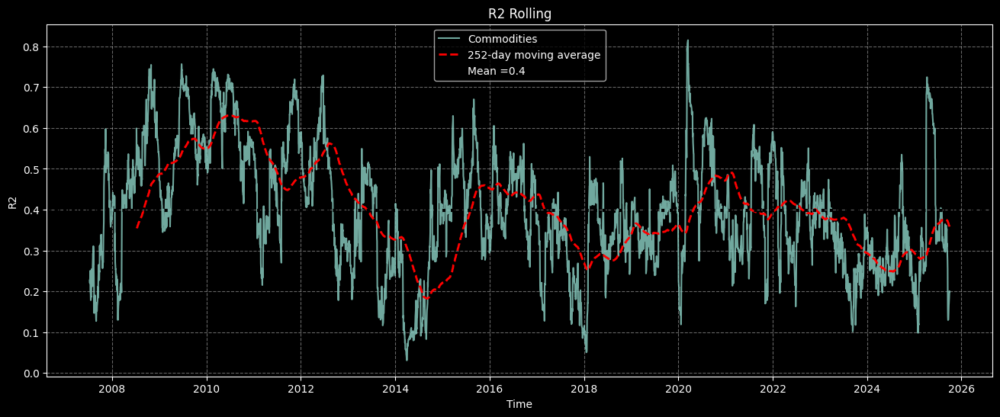

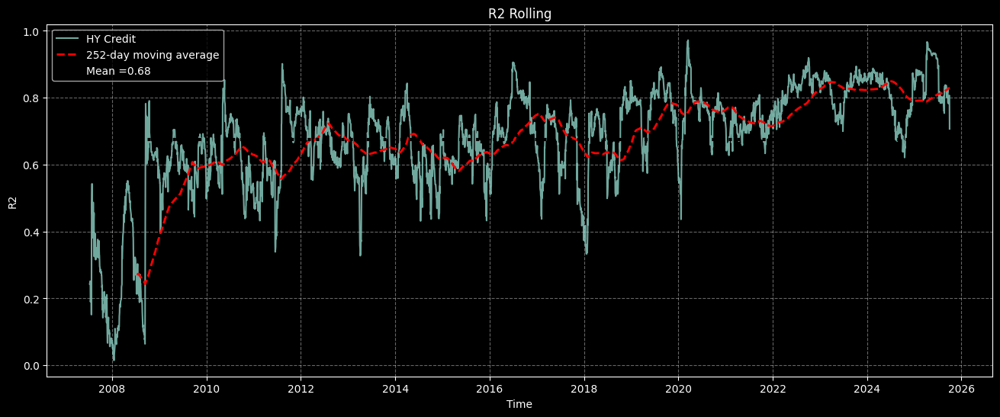

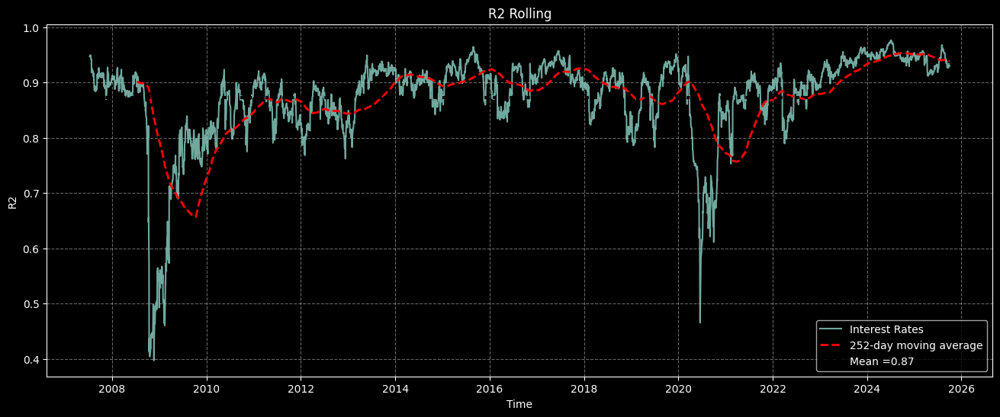

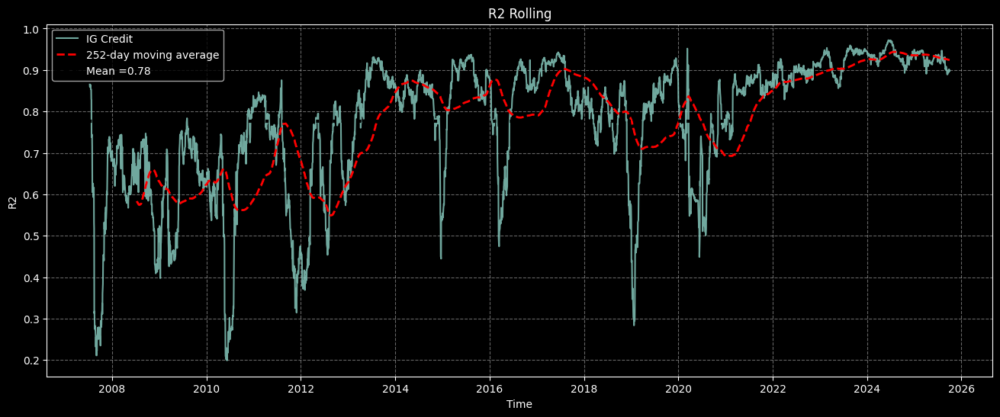

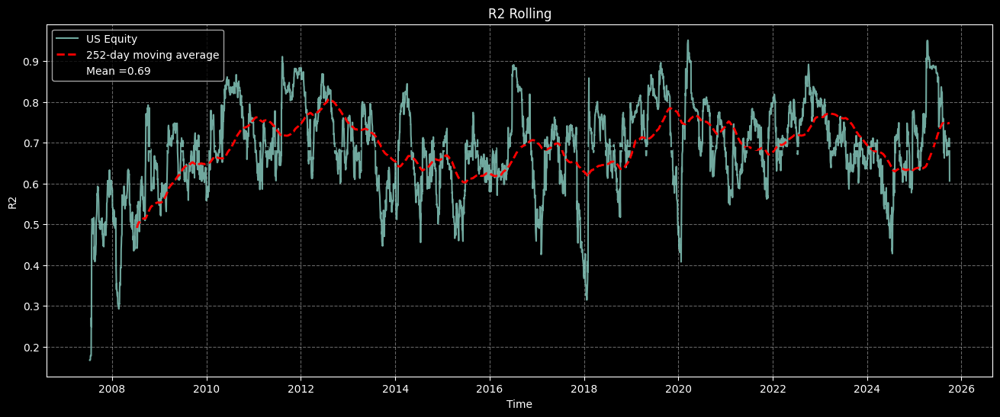

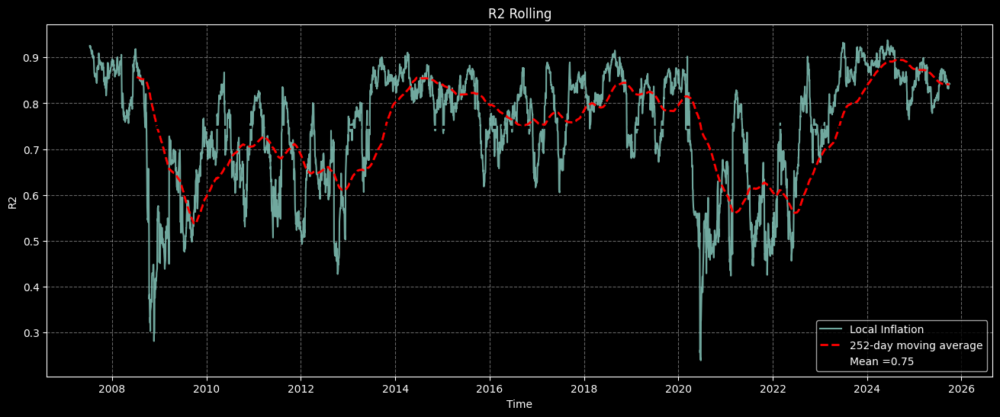

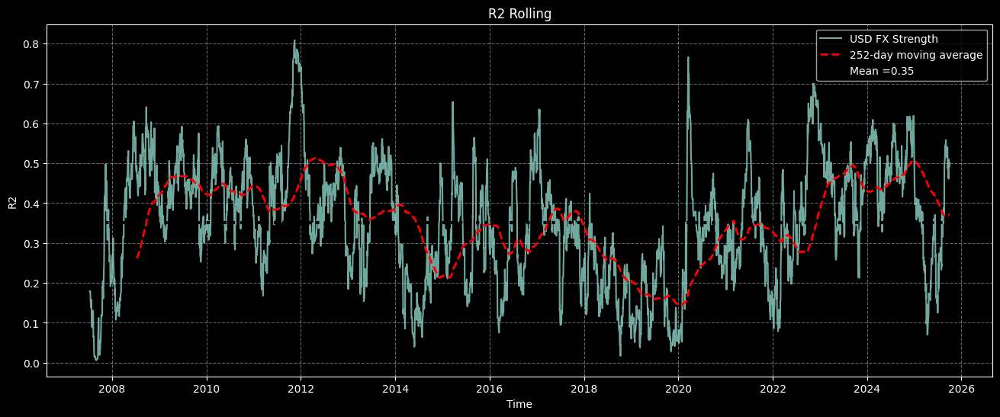

In [114]:
from matplotlib.collections import LineCollection


plt.figure(figsize=(16,6))

for col in rolling_r2.columns:
    plt.figure(figsize=(16,6))

    plt.plot(rolling_r2[col], alpha=0.8, label=col)


    plt.plot(
        rolling_r2[col].rolling(window=252).mean(),
        color="red", linestyle="--", linewidth=2,
        label=f"252-day moving average"
    )

    plt.axhline(rolling_r2[col].mean(), color="black", linestyle=":", linewidth=3, label=f'Mean ={rolling_r2[col].mean().round(2)}')
    plt.legend()
    plt.xlabel('Time')
    plt.ylabel('R2')
    plt.title('R2 Rolling')
    plt.grid(True,linestyle='--', alpha=0.4)

    
    plt.legend()




    plt.show()

#### $R^2$ Distributions


- Looking at the shape of how these are structured we see some variety. I would say we would expect better from the commodity and USD Strength factor, I suppose this loosely indicates perhaps we needed more features. Perhaps an Emerging markets ETF or other strong currencies against the dollar could allow the USD Strength to be slightly more explainable. To add, commodities also depend on this as they are imported and exported across global markets.
- Some distributions are skewed right which is intuitive after looking at the time-series. We can say that generally these factors are explainable, but in stress and uncertain periods, they become less expalainable.
- Upon looking at the Q-Q plots we can also see that most of these distributions, despite their appearance are actually somewhat close to normal. This is surpising as the tails seem quite large on the histogram. 

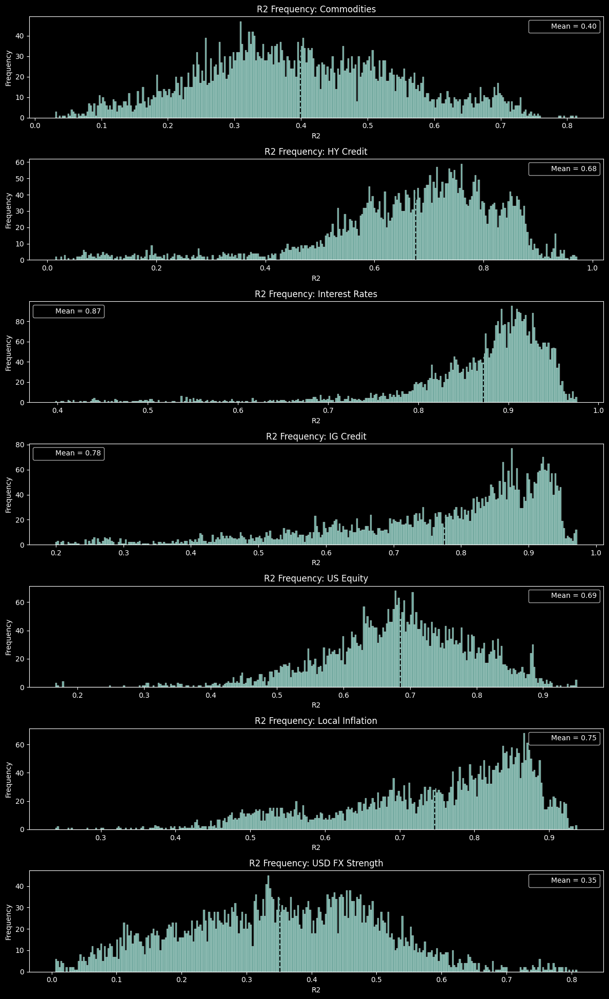

In [115]:
# Single-index: one column per factor
factors = list(rolling_r2.columns)
fig, axes = plt.subplots(nrows=len(factors), ncols=1, figsize=(12, 2.8*len(factors)), sharex=False)
if len(factors) == 1:
    axes = [axes]

for ax, f in zip(axes, factors):
    data = rolling_r2[f].dropna()
    sns.histplot(data, alpha=0.8, ax=ax, bins=300)
    ax.axvline(data.mean(), color="black", linestyle="--", linewidth=1.5, label=f"Mean = {data.mean():.2f}")
    ax.set_title(f"R2 Frequency: {f}")
    ax.set_xlabel("R2")
    ax.set_ylabel("Frequency")
    ax.legend()
plt.tight_layout()
plt.show()


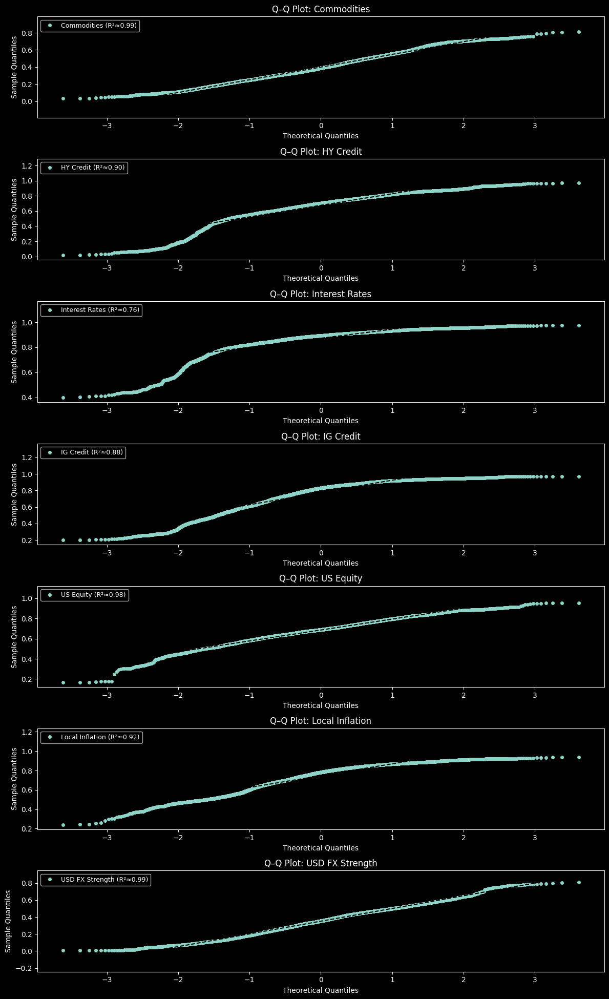

In [116]:
import scipy.stats as stats


fig, axes = plt.subplots(
    nrows=len(factors),
    ncols=1,
    figsize=(12, 2.8 * len(factors)),
    sharex=False
)

if len(factors) == 1:
    axes = [axes]

MIN_POINTS = 3

for ax, factor in zip(axes, factors):
    series = rolling_r2[factor].dropna().astype(float).values
    if series.size < MIN_POINTS:
        ax.set_visible(False)
        continue

    (osm, osr), (slope, intercept, r) = stats.probplot(series, dist="norm", fit=True)

    ax.plot(osm, osr, 'o', markersize=4, label=f"{factor} (R²≈{r**2:.2f})")
    ax.plot(osm, slope * osm + intercept, 'k--', linewidth=1.5)

    ax.set_xlabel('Theoretical Quantiles')
    ax.set_ylabel('Sample Quantiles')
    ax.set_title(f'Q–Q Plot: {factor}')
    ax.legend(loc='best', fontsize=9)

plt.tight_layout()
plt.show()


## Residual Analysis

Even though our target variable has been residualized will not be used in the final factor model, I am deliberately choosing to include it in the analysis so that we can gain some insight into what our model might not be able to explain. 


### Distributions

Looking at the distributions we can see that all of our distributions show a mean zero which is good. That being said it is evident that a lot of our distributions are close to normal but not quite normal. We also notice some outliers which are most likely from different regimes (we are looking to detect this).

We are going to use these distributions in combination with further statistics to individually analyze how the factors are constructed and if they require further adjustments

Moving forward I am cleaning the function so that we don't need to map the tuple every time we seleect a df. Given we only used a 60 day window and not multiple windows, I will also remove the index level for the window

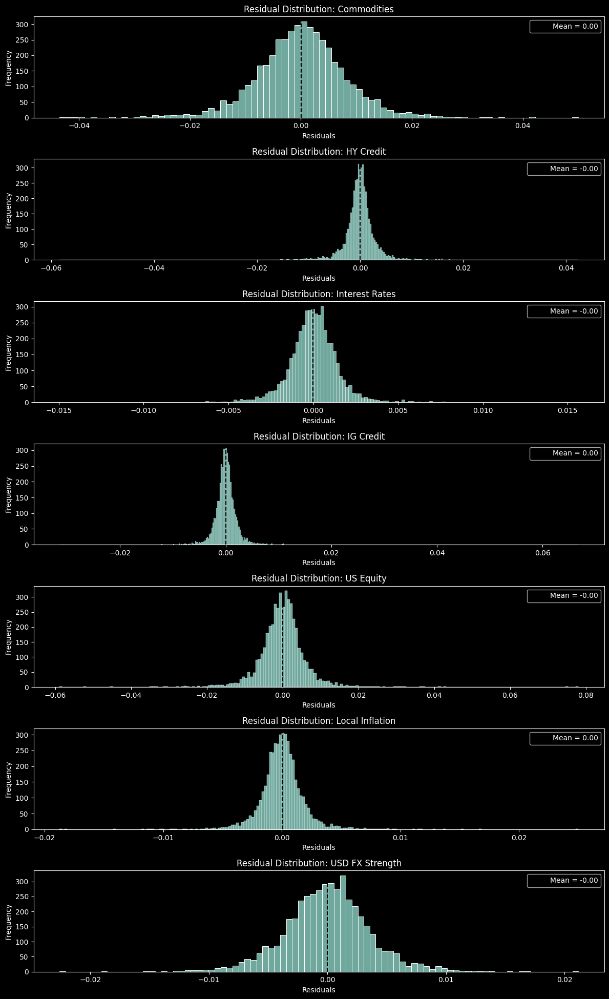

In [117]:
# Creating residuals df
residuals = analysis[0].dropna()  # residuals df

# Single-index: one column per factor
factors = list(residuals.columns)
fig, axes = plt.subplots(nrows=len(factors), ncols=1, figsize=(12, 2.8*len(factors)), sharex=False)
if len(factors) == 1:
    axes = [axes]

for ax, f in zip(axes, factors):
    data = residuals[f].dropna()
    sns.histplot(data, alpha=0.8, ax=ax)
    ax.axvline(data.mean(), color="black", linestyle="--", linewidth=1.5, label=f"Mean = {data.mean():.2f}")
    ax.set_title(f"Residual Distribution: {f}")
    ax.set_xlabel("Residuals")
    ax.set_ylabel("Frequency")
    ax.legend()
plt.tight_layout()
plt.show()


### Further Distribution Statistics


I want to take a deeper dive on how these distributions behave so we can understand more about the factors we have created:


#### TL;DR:
- All residuals are mean-zero but strongly non-normal. Most show fat tails (outliers/shocks). Commodities and Rates lean left, Equities/Inflation/IG Credit lean right, HY Credit and IG Credit have extreme kurtosis. USD FX is the most “well-behaved,” but still fat-tailed.
- Comments: We could consider reviewing a rolling kurtosis across the time-series to better review where the extreme tails are happening (I would imagine during market shocks)
 
##### Commodities Residuals
- Residuals are centered with typical daily volatility but display mild left skew and fat tails. This indicates generally balanced behavior, punctuated by downside shocks and regime-driven spikes.

##### HY Credit

- Exhibits similar behaviour but displays a much larger kurtosis implying that there is a large outliers. As a result we can say that the pure credit factor can show big, rare jumps. 


##### Interest Rates

- Residuals are usually quiet but occasionally show very large shocks, especially downside, which is consistent with rate surprises or policy events.

##### IG Credit Residuals

- Residuals are calm most of the time but occasionally experience extreme, positive jumps. This pattern suggests infrequent but sharp repricings in investment-grade credit markets, perhaps linked to liquidity events or crisis-driven spread moves.

##### US Equity Residuals

- Residuals are centered but show asymmetry and fat tails. The moderate positive skew suggests more frequent upward surprises, while the kurtosis points to volatility clustering and crisis episodes.

##### Local Inflation Residuals

- Residuals are usually calm but occasionally exhibit sharp upward shocks. This reflects inflation data surprises or abrupt repricing of inflation expectations.

##### USD FX Strength Residuals

- Residuals are nearly symmetric and relatively well-behaved compared to other factors. Still, the excess kurtosis shows occasional larger-than-expected moves, consistent with abrupt FX regime adjustments.


In [118]:
from scipy.stats import skew, kurtosis, jarque_bera

cols = ['Mean', 'Std', 'Skew', 'excess_kurtosis', 'Jarque-Bera p-value']
residuals_distribution_summary = pd.DataFrame(columns=cols)




for i in residuals: 
    series = pd.to_numeric(residuals[i], errors="coerce").dropna()

    mean = series.mean()
    std = series.std()
    sk = skew(series)
    kt = kurtosis(series)
    jb = jarque_bera(series).pvalue

    residuals_distribution_summary.loc[i] = [mean, std, sk, kt, jb]
    


    residuals_distribution_summary.loc[i] = [
        round(mean, 2),
        round(std, 2),
        round(sk, 2),
        round(kt, 2),
        round(jb, 2)
    ]

residuals_distribution_summary

,Mean,Std,Skew,excess_kurtosis,Jarque-Bera p-value
Commodities,0.0,0.01,-0.12,2.34,0.0
HY Credit,-0.0,0.00,-0.10,37.15,0.0
Interest Rates,-0.0,0.00,-0.19,10.35,0.0
IG Credit,0.0,0.00,4.18,125.06,0.0
US Equity,-0.0,0.01,0.59,17.69,0.0
Local Inflation,0.0,0.00,0.44,16.17,0.0
USD FX Strength,-0.0,0.00,-0.04,1.93,0.0


### Q-Q Plot inference

### TL;DR
- Our residuals are pretty much normal in the center, however the majority of them deviate on the tails. Both our HY and IG Credit Factors are highly non-Gaussian, but strangely enough they seem inverted. I wonder if compressing them together using PCA could enable them to have a more Gaussian-like shape by balancing the tails. Commodities and Rates both are leaning towards the downside which is consistent with our previous analysis. The most normal distribution we have is the USD FX strength which implies we are explaining it well.

#### Commodities
- We can see that the majority of the points hug the line implying that most of our distribution is close to normal. We can also see that the tails ever so slighlty bend, the left tail more so than the right, implying downside shocks could be more common. **R^2** of 0.98 implies that the model is a good fit aside from the extremities. 

#### HY Credit
- $R^2$ of 0.75 implies not as strong of a fit, meaning our distribution is overall not Gaussian. We also see high levels of divergence at the tails with some extremities on the downside. This suggests that outliers can be frequent and large instead of them being rare events, we will have to look at this further.

#### IG Credit
- $R^2$ of 0.66 making it the poorest fit of all, and also strongly suggesting non-Gaussian behaviour. Interestingly enough the High Yield Q-Q is almost like an inverse of the Investment Grade Q-Q. As it also displays high levels of divergence at the tails, but this time on the upside.

#### Interest Rates
- $R^2$ of 0.92 making it a decent fit, implying that most of the distribution is Gaussian. Tails are bending away, skewed to the left which is expected. We can see that the pattern is mostly calm but sometimes we can get large downside moves - I would imagine these shocks come from emergency policies.

#### Local Inflation
- $R^2$ of 0.87 meaning the center is somewhat normal. Deviating tails go slightly upward which mirrors earlier skew and kurtosis statistics. We can infer that the inflation factor is predictable most of the time, but has periods of surprises 

#### US Equity
- $R^2$ of 0.88 shows that our residuals are somewhat normally distributed which is great news given this is the target variable. Given the target will not be a part of the future factor model itself, I still think this will help us 'understand what we dont understand' about the target. I would imagine that the model is missing factors such as earnings events for largely weighted components of the ETFs throughout the time-series.

#### USD FX Strength
- $R^2$ of 0.98 is easily the most Gaussian out of our residuals, tails are very mildly deviating from normal, the shape of the Q-Q is almost symmetric which makes sense given our skew is near zero. 

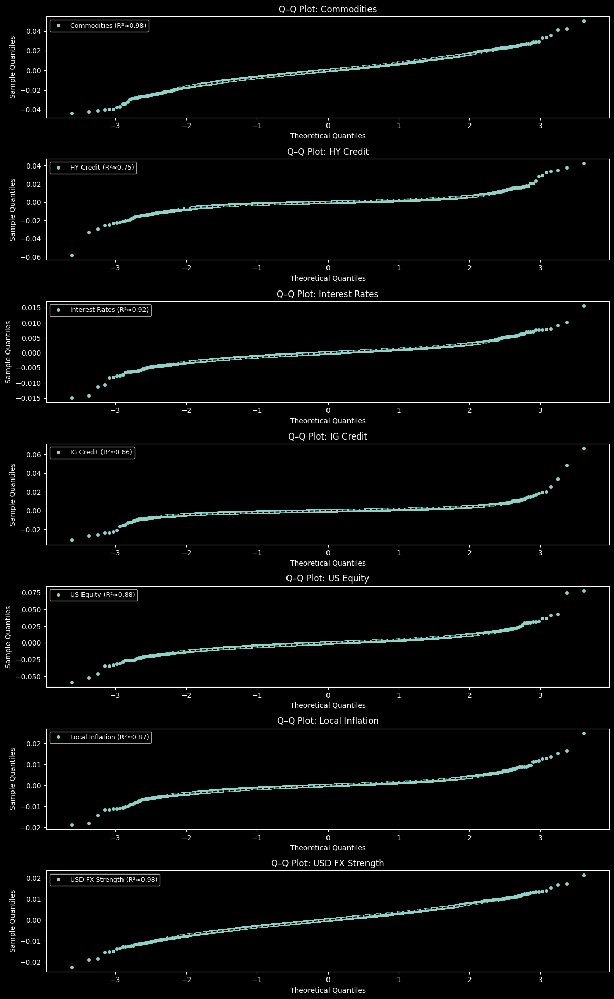

In [119]:
fig, axes = plt.subplots(
    nrows=len(factors),
    ncols=1,
    figsize=(12, 2.8 * len(factors)),
    sharex=False
)

if len(factors) == 1:
    axes = [axes]

MIN_POINTS = 3

for ax, factor in zip(axes, factors):
    series = residuals[factor].dropna().astype(float).values
    if series.size < MIN_POINTS:
        ax.set_visible(False)
        continue

    (osm, osr), (slope, intercept, r) = stats.probplot(series, dist="norm", fit=True)

    ax.plot(osm, osr, 'o', markersize=4, label=f"{factor} (R²≈{r**2:.2f})")
    ax.plot(osm, slope * osm + intercept, 'k--', linewidth=1.5)

    ax.set_xlabel('Theoretical Quantiles')
    ax.set_ylabel('Sample Quantiles')
    ax.set_title(f'Q–Q Plot: {factor}')
    ax.legend(loc='best', fontsize=9)

plt.tight_layout()
plt.show()


## Rolling Distributional Statistics

I want to view how the distribution changes through time so we can get a deeper insight into how the residuals behave. Perhaps there are some outliers during certain events which are causing the distribution to become skewed.  
I am going to use the 60 day window used previously in order to be consistent with our model so the first step is to compute the rolling statistics. 


In [120]:
rolling_dist_stats = residuals.rolling(60).agg(['mean','std','skew','kurt'])
rolling_dist_stats.dropna(inplace=True)

rolling_dist_stats.head(3)

Commodities                               HY Credit            \
                  mean       std      skew      kurt      mean       std   
Date                                                                       
2007-10-04    0.000925  0.006678 -0.460792 -0.251454  0.000876  0.005252   
2007-10-05    0.000862  0.006717 -0.435506 -0.324566  0.000801  0.005254   
2007-10-08    0.000560  0.006983 -0.433382 -0.410606  0.000761  0.005242   

                               Interest Rates            ... US Equity  \
                skew      kurt           mean       std  ...      skew   
Date                                                     ...             
2007-10-04  0.024969  0.133255       0.000211  0.001057  ...  0.207749   
2007-10-05  0.066603  0.132640       0.000170  0.001097  ...  0.254076   
2007-10-08  0.087983  0.164205       0.000164  0.001100  ...  0.258048   

                     Local Inflation                                \
                kurt            mean       std      skew      kurt   
Date                                                                 
2007-10-04  0.228814       -0.000140  0.001114  0.149572 -0.732466   
2007-10-05  0.416296       -0.000108  0.001132  0.106087 -0.828158   
2007-10-08  0.411968       -0.000086  0.001130  0.053198 -0.818538   

           USD FX Strength                                
                      mean       std      skew      kurt  
Date                                                      
2007-10-04        0.000404  0.003756  0.637710  0.498970  
2007-10-05        0.000515  0.003637  0.741004  0.615213  
2007-10-08        0.000574  0.003661  0.689319  0.479493  

[3 rows x 28 columns]

## Time-Series

We are going to look deeper into this time series, but on a surface level we can definitely note some fluctuations amongst our Factors throughout certain events. I am somewhat impressed with the fit of our model given the noise of the data.

<Figure size 1600x600 with 0 Axes>

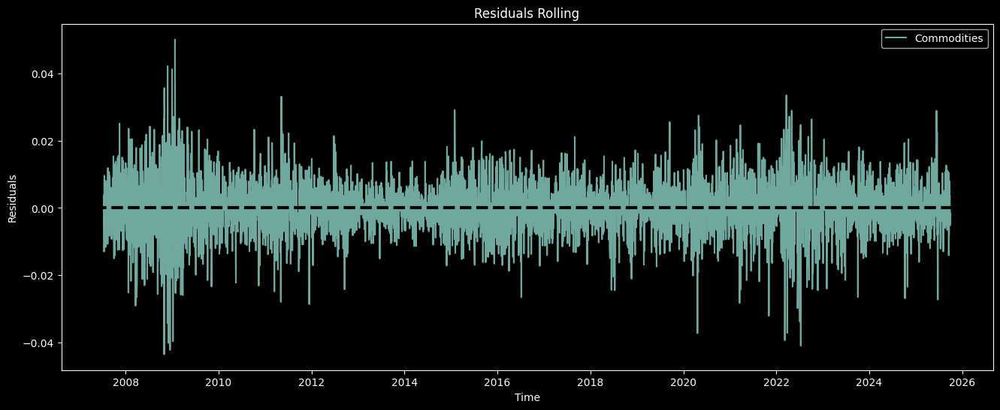

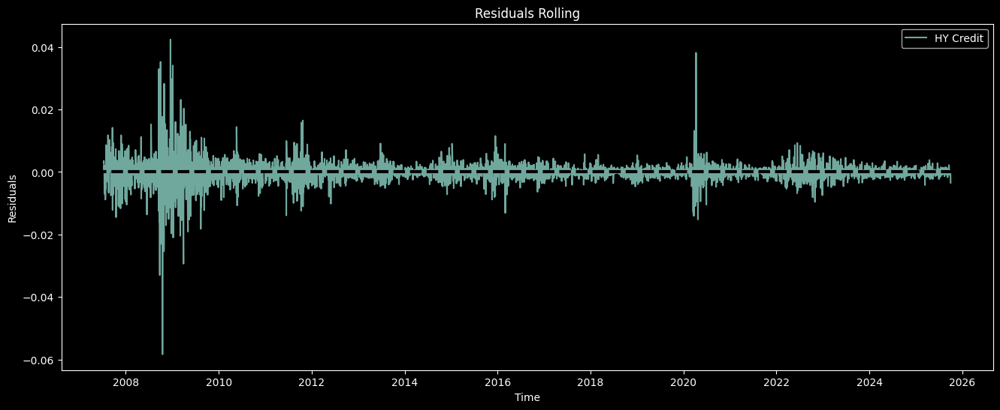

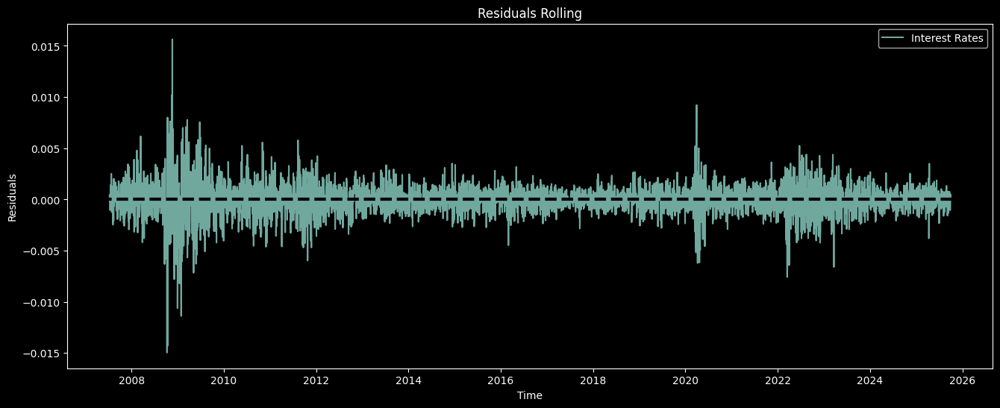

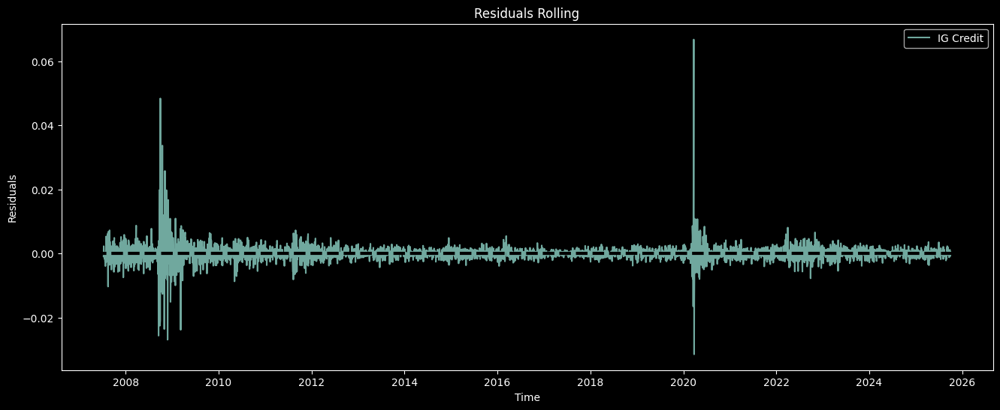

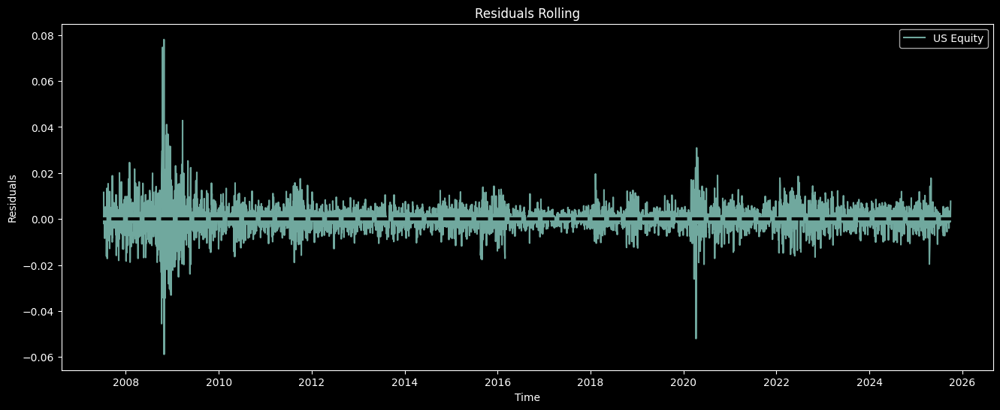

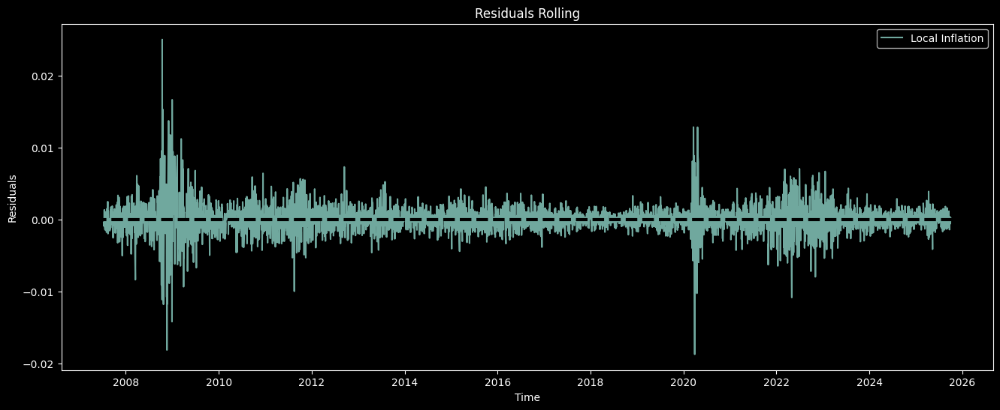

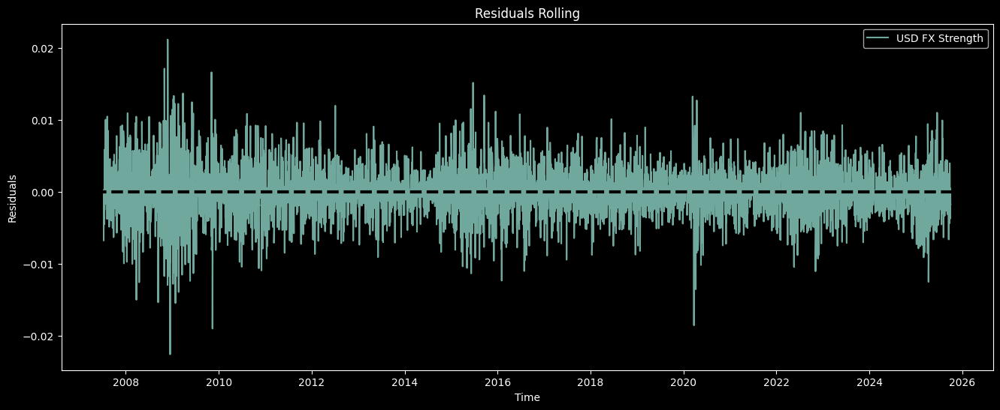

In [121]:
plt.figure(figsize=(16,6))

for col in residuals.columns:
    plt.figure(figsize=(16,6))

    plt.plot(residuals.dropna()[col], alpha=0.8, label=col)
    
    plt.legend()
    plt.xlabel('Time')
    plt.ylabel('Residuals')
    plt.title('Residuals Rolling')

    plt.axhline(0, color="black", linestyle="--", linewidth=3)

    plt.show()

## Time-Series Distributional Statistics

### TL;DR
It is clear that certain events are having influence over our factors. We are not able to capture the variance throughout crises periods such as the GFC in 2008, COVID-19 pandemics in 2020 and commodity shocks in 2022. That being said, I do not think that ommitting these events will make our distrubutions become normal. They will become significantly more normal, but still not quite enough. 

If anything, given our goal is to model market regimes, it is good that our series are displaying these varying dynamics as it proves they exist. That being said, it seems evident that there could be autocorrelation as we see that volatility spikes together. Perhaps this can help us identify regimes with higher confidence. 

---

#### Commodities
Mean seemingly clusters around 0, making the residualization seem unbiased. In terms of std, we can see large spikes just following the GFC, makes sense if the rolling computation was made around the GFC. We also see higher std during 2022 which saw commodity shocks from the Ukraine war. Skew and kurtosis are somewhat noisy here, it does not appear that there is much relationship here, at a stretch we could say that the kurtosis shows a rough pattern with the std but not enough to be notable. 


#### HY Credit
Again we can see little spikes during GFC and Commodity Shock events. Notably we see a large spike in skew here throughout 2020, we can also see a spike in kurtosis at the same time. I do think that these spikes are having some influence over the rest of the distribution. I would imagine that if these spikes did not exist, we would probably expect a more Gaussian structure

#### Interest Rates
Mean during the GFC era is a lot more prolonged here, perhaps the interest rates were more dynamic in this time? Either this or there was more uncertainty in where interest rates would go. We see the same spikes in the volatility here but the interest rates factor seems like a more pronounced version of HY and IG credit factors. This makes sense because they are loosely tied together, but could be a cause for concern if they are still correlated. In terms of skew and kurtosis we can see a massive spike during the GFC which is most likely making the distribution less Gaussian. 

#### IG Credit
Interestingly here we could make a cause to support the earlier argument of IG and HY credit being inverted. HY Credit is skewed in both directions but definitely holds a more negative weight, on the other hand IG credit looks to have a more positive weight. Once again we see massive spikes during crises events which is most likely having an effect on the distribution structure.

#### US Equity
Mean and std are similar to most but we do see a spike during the GFC. What is interesting here is the spikes are not as prevalent through other crises events which implies that the other factors are contributing to the model well. Unfortunately this is not supported in the skew and kurtosis, which show large spikes during both events.

#### Local Inflation
I think that the mean and std here shows somewhat similar behaviour to interest rates. Notably the standard deviation seems to tell a similar story. We also see large spikes in both crises events once again which definitely influences the distribution shape. That being said, even without these spikes I still think we would not see a Gaussian Structure in our data. 

#### USD FX Strength
Very low errors here, this distribution was the best one we had. Notably the skew and kurtosis are somewhat consistent except from the COVID-19 spike which undoubtedly influences the distribution. 


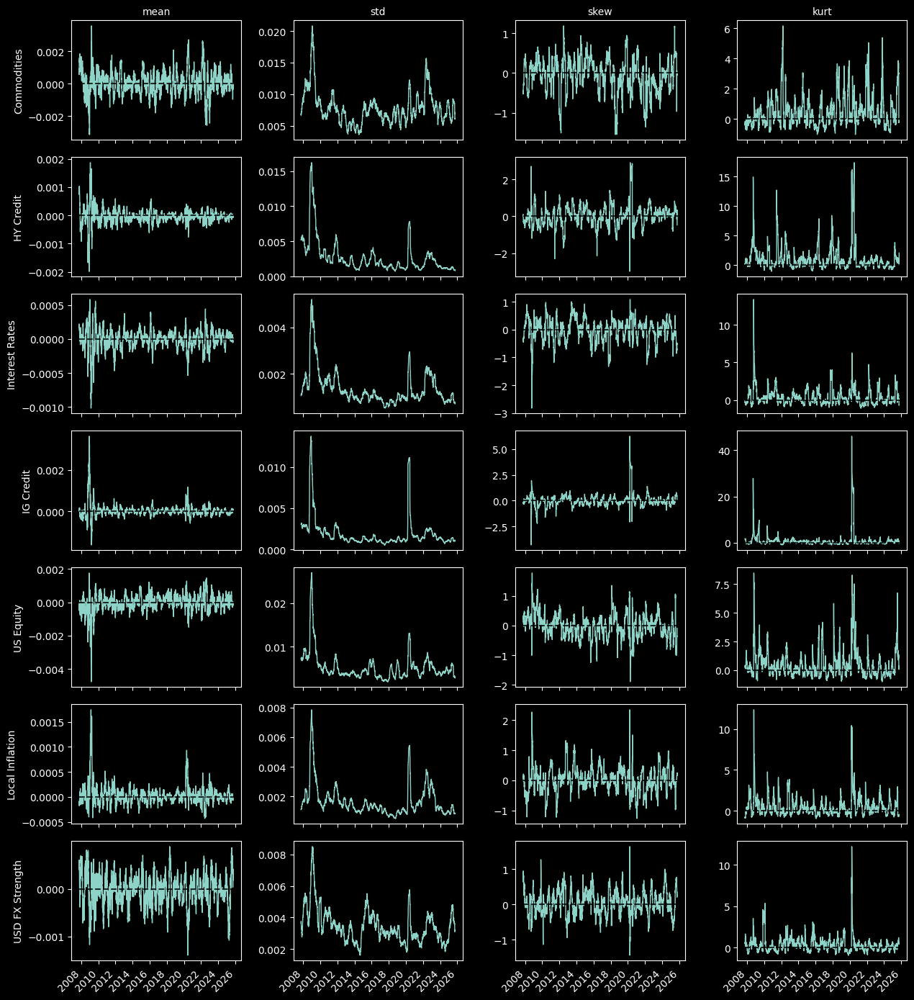

In [122]:
factors = pd.unique(rolling_dist_stats.columns.get_level_values(0))  # preserve order found

stats   = ['mean','std','skew','kurt']

nrows, ncols = len(factors), len(stats)
fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols,
    figsize=(3.2 * ncols, 2.0 * nrows),
    sharex=True
)

# normalize axes to 2D array
if nrows == 1 and ncols == 1:
    axes = np.array([[axes]])
elif nrows == 1:
    axes = np.array([axes])
elif ncols == 1:
    axes = axes[:, None]

for i, factor in enumerate(factors):
    for j, stat in enumerate(stats):
        ax = axes[i, j]
        col = (factor, stat)
        if col in rolling_dist_stats.columns:
            s = rolling_dist_stats[col].dropna()
            ax.plot(s.index, s.values, linewidth=1)

            # Zero baseline helps interpret mean/skew/kurt (kurt here is excess kurtosis)
            if stat in ('mean', 'skew', 'kurt'):
                ax.axhline(0.0, linestyle='--', linewidth=1.5, alpha=0.8, color='black')

        else:
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center', transform=ax.transAxes)

        if i == 0:
            ax.set_title(stat, fontsize=10)
        if j == 0:
            ax.set_ylabel(factor, fontsize=10)
        if i < nrows - 1:
            ax.tick_params(labelbottom=False)
            
        for ax in axes[-1, :].ravel():
            ax.tick_params(axis='x', labelrotation=45)
            for lbl in ax.get_xticklabels():
                lbl.set_horizontalalignment('right')


plt.tight_layout()
plt.show()


### Autocorrelation

Briefly I want to review the serial correlation throughout our residuals, but given our distributional statistics I believe that we may have some autocorrelation here.

Residuals seem to show mild autocorrelation across lags, looking at the Ljung-Box test, we can confirm that all these lags are significant except from the Interest Rates factor. That being said, we should interpret this as regime-relevant structure rather than a flaw in the model. If we were to capture everything but white noise in our residuals, then there would be nothing left for our regimes to be modeled on!

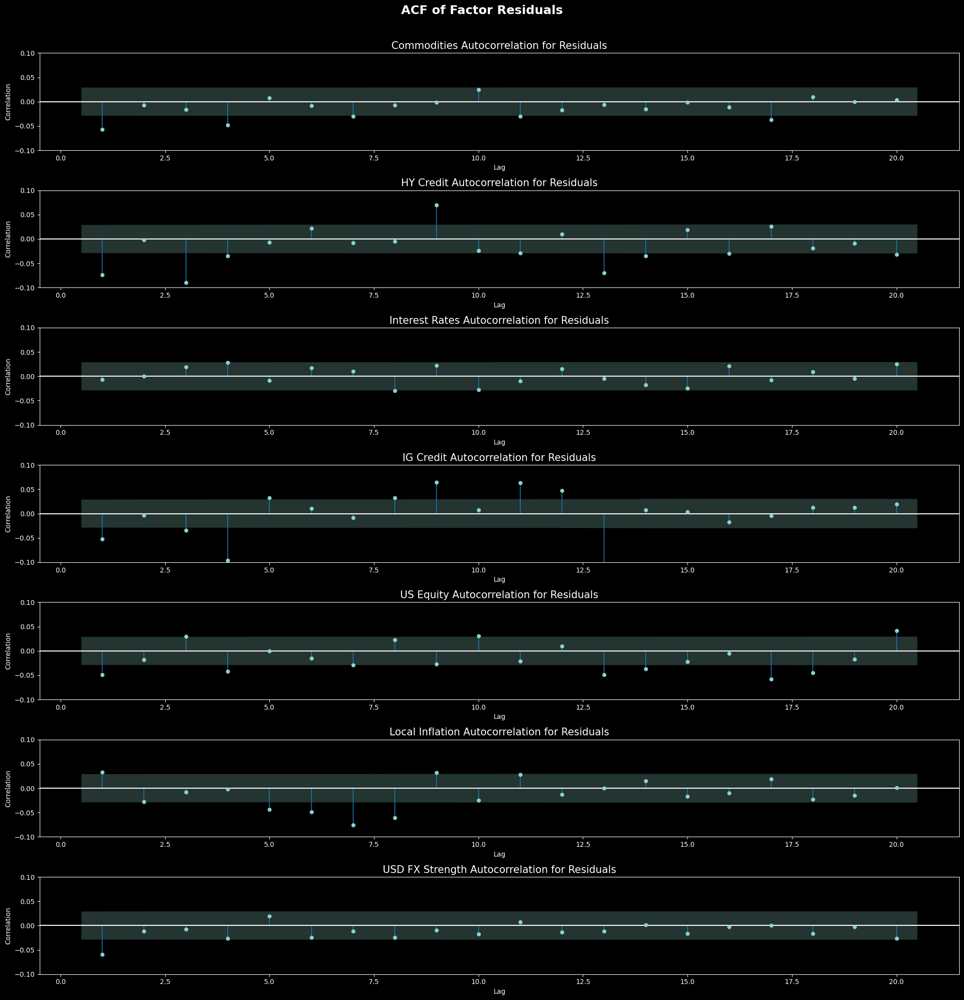

lb_stat  lb_pvalue
Factor          Lag                    
Commodities     1      14.95       0.00
                5      27.26       0.00
                10     34.92       0.00
                20     48.95       0.00
HY Credit       1      24.98       0.00
                5      67.73       0.00
                10     95.43       0.00
                20    143.04       0.00
Interest Rates  1       0.22       0.64
                5       5.90       0.32
                10     17.52       0.06
                20     28.70       0.09
IG Credit       1      12.66       0.00
                5      65.78       0.00
                10     90.90       0.00
                20    190.31       0.00
US Equity       1      11.22       0.00
                5      24.72       0.00
                10     39.62       0.00
                20     95.64       0.00
Local Inflation 1       4.95       0.03
                5      17.48       0.00
                10     79.16       0.00
                20     91.62       0.00
USD FX Strength 1      16.00       0.00
                5      21.92       0.00
                10     29.91       0.00
                20     37.54       0.01

In [123]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.diagnostic import acorr_ljungbox



cols = residuals.columns




fig, axes = plt.subplots(nrows=len(cols), ncols=1, figsize=(20,len(cols)*3))

fig.suptitle('ACF of Factor Residuals',fontsize=18,fontweight='bold')
for i, col in enumerate(cols):


    ### 1 Day Autocorrelation Plot
    plot_acf(residuals[col].dropna(), lags=20, ax=axes[i],vlines_kwargs={'color':'tab:blue','alpha':0.8},zero=False)
    axes[i].set_ylim(-0.1,0.1)
    axes[i].set_title(f'{col} Autocorrelation for Residuals',fontsize=15)
    axes[i].set_xlabel('Lag')
    axes[i].set_ylabel('Correlation')
    
    

plt.tight_layout(rect=[0,0,1,0.97])
plt.show()



out = {}
for col in residuals.columns:
    out[col] = acorr_ljungbox(residuals[col].dropna(), lags=[1,5,10,20], return_df=True)
    
results = pd.concat(out, names=["Factor","Lag"])

results = results.round(2)
results

### SEs, Betas + Confidence intervals 

I am going to take evaluate the behaviour of the betas, alongside the Standard Errors and take a quick look at the bandwidth for the confidence intervals. 

Given that there are betas for each feature in each regression, it would take a long time to evaluate each one individually, so for the sake of time, I will just do an analysis for the features looking to model the target feature. 

I begin by selecting the data frames we made from the regression function we made earlier. 

In [124]:
se_df = analysis[3].dropna()
beta_df = analysis[2].dropna()

se_df.head(3) , beta_df.head(3)

(Target     Commodities                                                     \
 Regressor     Constant HY Credit IG Credit Interest Rates Local Inflation   
 Date                                                                        
 2007-07-12    0.000832  0.260929  0.672242       1.246377        0.893949   
 2007-07-13    0.000823  0.247830  0.639196       1.238446        0.876923   
 2007-07-16    0.000779  0.243075  0.719180       1.464637        0.949821   
 
 Target                                 HY Credit                      ...  \
 Regressor  US Equity USD FX Strength Commodities  Constant IG Credit  ...   
 Date                                                                  ...   
 2007-07-12  0.114832        0.040184    0.039837  0.000339  0.441466  ...   
 2007-07-13  0.114518        0.038406    0.037818  0.000326  0.483330  ...   
 2007-07-16  0.112056        0.047468    0.032242  0.000303  0.470133  ...   
 
 Target          US Equity                                 U

Now I am going to take the multi index data frame, and create a dictionary of dataframes containing the time-series statistics for each factor. 

In [125]:
se_dfs = {top: se_df.xs(top, axis=1, level=0, drop_level=True)
       for top in se_df.columns.get_level_values(0).unique()}


beta_dfs = {top: beta_df.xs(top, axis=1, level=0, drop_level=True)
       for top in beta_df.columns.get_level_values(0).unique()}

se_dfs.keys(), beta_dfs.keys()

(dict_keys(['Commodities', 'HY Credit', 'IG Credit', 'Interest Rates', 'Local Inflation', 'US Equity', 'USD FX Strength']),
 dict_keys(['Commodities', 'HY Credit', 'IG Credit', 'Interest Rates', 'Local Inflation', 'US Equity', 'USD FX Strength']))

Given we are only doing this for the US Equity factor, I am selecting only this. We can reuse this code and just call a different key from the dictionary if we wish to evaluate the features from different models. 

I then calculate the upper ad lower bounds of the Confidence Intervals by multiplying the Standard Error by 1.96, then adding or subtracting it from the betas.

In [126]:
equity_se = se_dfs['US Equity']
equity_beta = beta_dfs['US Equity']



# Build confidence intervals
ci_lower = equity_beta - (1.96 * equity_se)
ci_upper = equity_beta + (1.96 * equity_se)

equity_ci_df = pd.concat(
    [equity_beta.stack(), ci_lower.stack(), ci_upper.stack()], axis=1)
equity_ci_df.columns = ['beta', 'ci_lower', 'ci_upper']

#
equity_ci_df.head()

beta  ci_lower  ci_upper
Date       Regressor                                   
2007-07-12 Commodities     0.207059  0.009204  0.404913
           Constant        0.001299 -0.000220  0.002818
           HY Credit       0.643306 -0.012587  1.299200
           IG Credit       0.192920 -1.062090  1.447930
           Interest Rates  1.033197 -1.933207  3.999602

## Time-Series Betas, SEs + Confidence Intervals

Now we can evaluate the betas across time alongside their confidence intervals to get some intuition. 
I am also going to plot the mean of the betas, 252 day moving average of the betas so we can smooth betas and see if there is any trend  

### Commodities:
Commodity betas are an interesting case, as we actually see their impact shift from positive to around zero throughout the time-series. We could argue as the betas approach more recent time they actually appear to become more stable.

Intuitively we can say that commodities used to have a positive effect on US Equities, but in more recent times, this effect may have diminished. Note that this does not mean that it will continue, this could be a temporary case. 

### Constant:
Hovers around zero with some slight noise (expected). Only notable thing about this is the major spike in the 2008 GFC and COVID-19 periods, implicating instability at these times which is also expected. 

### HY Credit: 
Remains positive pretty much all of the time, the only time it dips below 0 is in 2008, which is ever so slight. Something very interesting about this is that we actually see an upward trend in these betas. 

This implies that US Equity returns have become increasingly influenced by high yield(risky) credit. Perhaps this could imply that the US Equity market is increasing in dependence on HY, thus increasing in risk?

### IG Credit:
Generally speaking the IG credit factor betas are above 0, suggesting that they have a positive reltionship with US Equities.
However we should note there are large spikes in late 2015, where the betas seem largely uncertain due to the increase in confidence interval bandwidth. 
All things considered, we can still say that they betas are somewhat consistent across the series in spite of their fluctuations. 

### Interest Rates:
Remain somewhat consistent across the series, although the variance seems to be somewhat high. Spikes in the GFC and late 2015 cause the betas to shift to positive at times, likely because of regime shifts of some sort. 

### Local Inflation:
Hovers ever so slightly above 0, implying there is a slight positive relationship with US Equity. Given the Local Inflation factor can be positive and negative a lot of the time, it could suggest that the betas are 'uncertain' of how inflation effects US Equity.

### USD FX Strength: 
Similar to the inflation factor but instead it is more inversed, we see it hovers around the 0 mark but displays some downward pressure. What I would say is interesting about this is that, generally speaking, the betas are negative, but there tends to be short-term shifts pushing the beta into a positive realm,but not enough to make the beta 'globally' positive. 

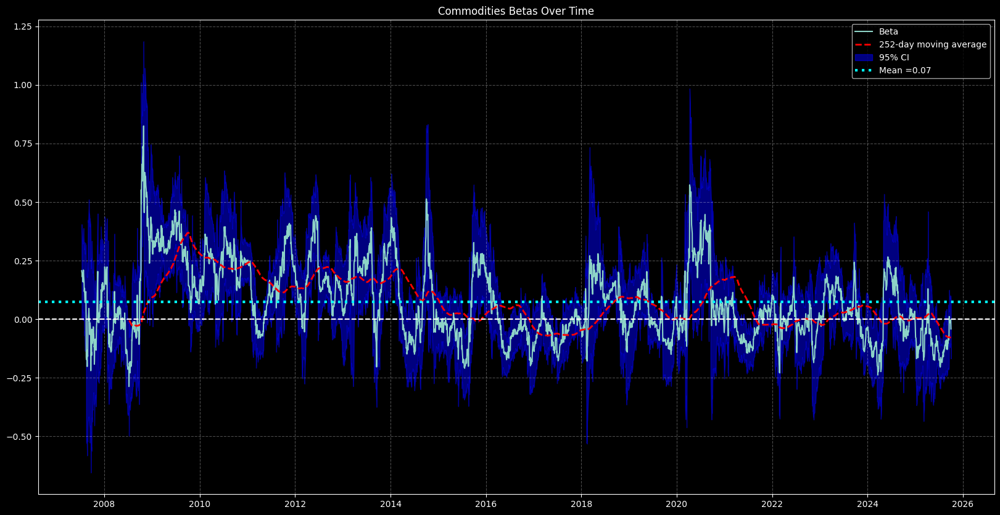

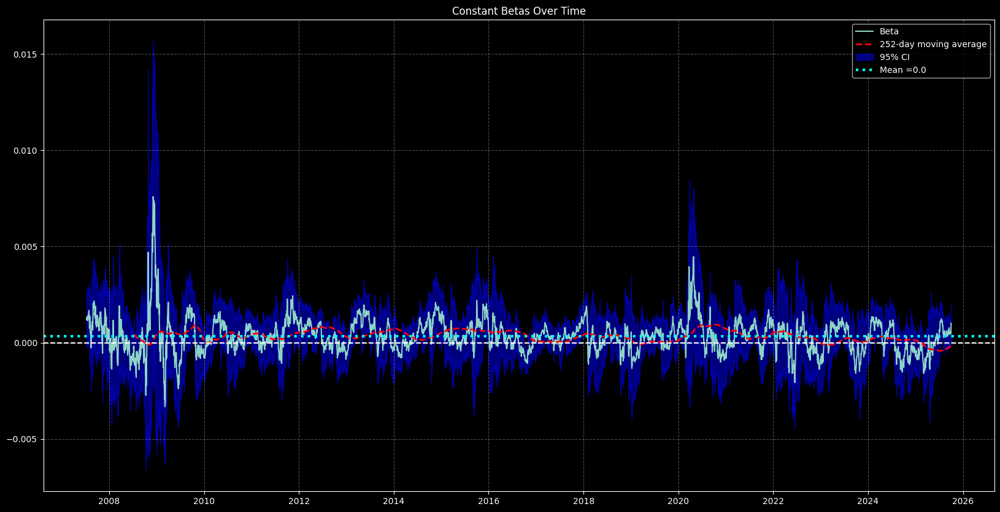

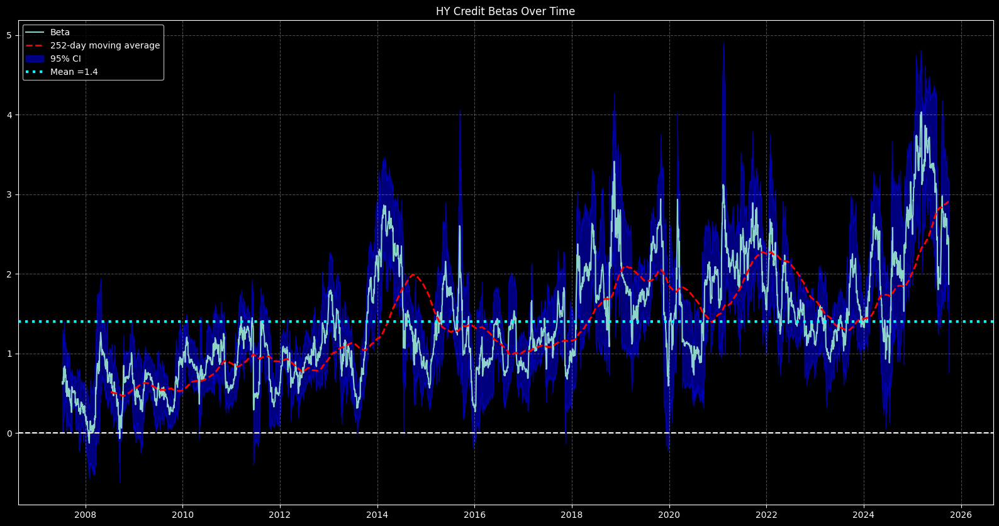

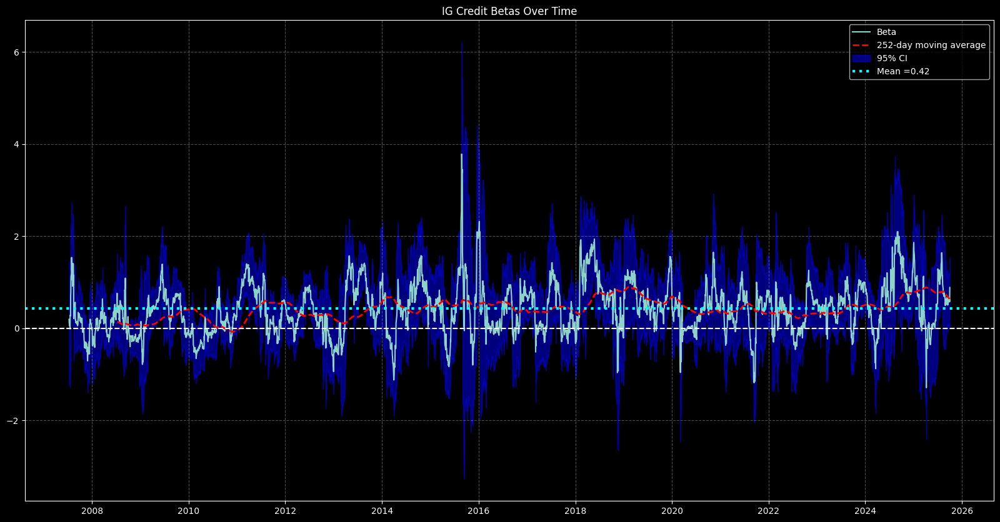

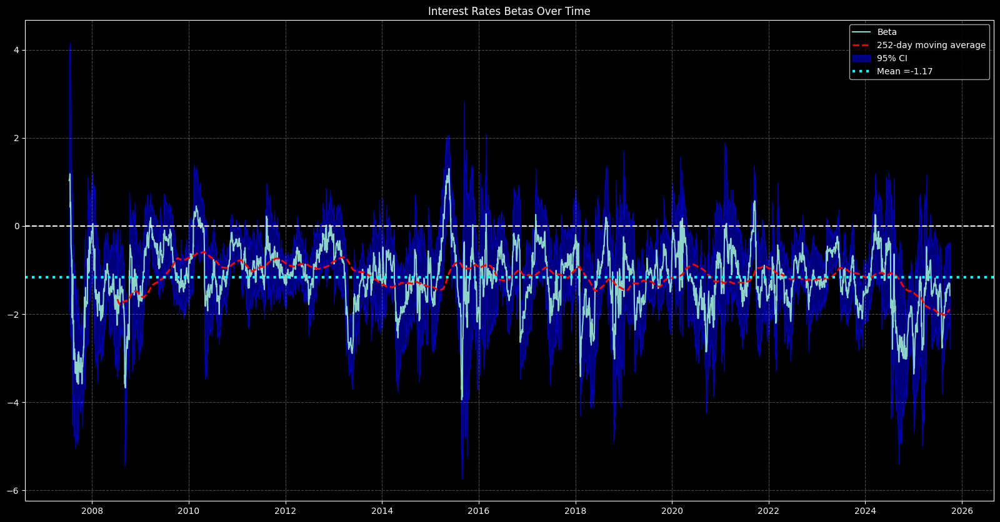

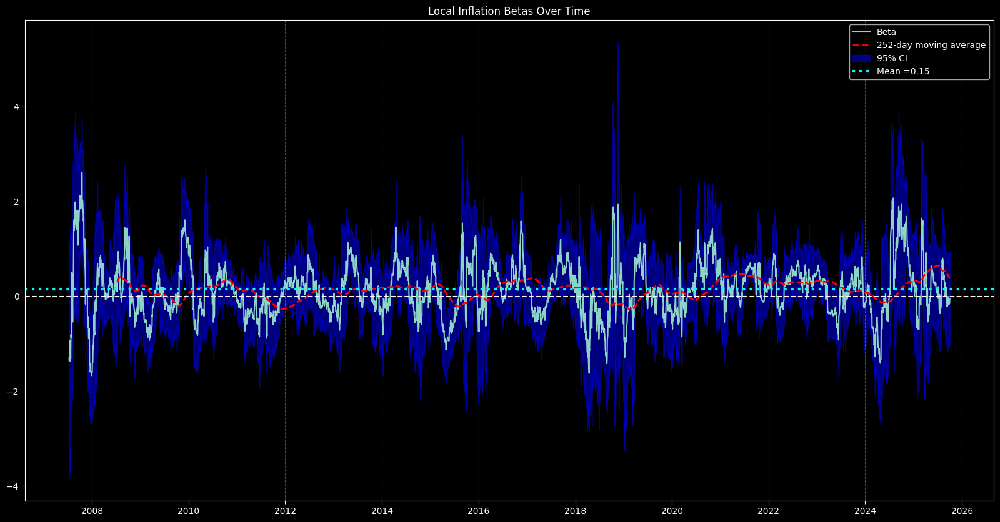

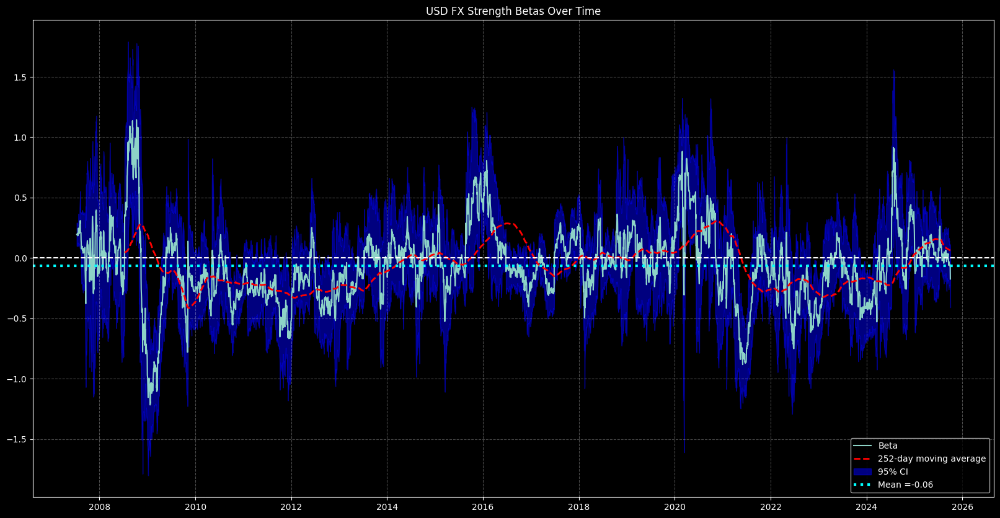

In [127]:
factors= equity_beta.columns

for col in factors:
    plt.figure(figsize=(20,10))
    plt.plot(equity_beta.index, equity_beta[col], label='Beta')
    
    plt.plot(equity_beta[col].rolling(window=252).mean(),
             color="red", 
             linestyle="--", 
             linewidth=2,
             label=f"252-day moving average")
    plt.fill_between(
        equity_beta.index,
        ci_lower[col],
        ci_upper[col],
        color='blue', alpha=0.5, label='95% CI'
    )
    plt.axhline(0, color='white', linestyle='--')
    plt.axhline(equity_beta[col].mean(), color="cyan", linestyle=":", linewidth=3, label=f'Mean ={equity_beta[col].mean().round(2)}')
        
    plt.legend()
    plt.grid(True,linestyle='--', alpha=0.3)
    plt.title(f'{col} Betas Over Time')
plt.show()

### Confidence Interval Spreads
Given that the bandwidth of the Confidence Intervals (CIs) seem to fluctuate, I thought it could be interesting to see how these spreads change across time and how they are distributed. 

The CI spread will intuitively give us a metric of certainty surrounding our betas. When the spread is high, the betas are more uncertain, when the CI spreads are low, the betas are more certain. 

Looking at the distribution we can see that spreads tend to display a right skewed distribution, meaning they at times, can widen, just not as often as they would in normal behaviour. 

Interestingly enough one could argue that if the sample size increased to infinity, the Local Inflation CI spreads could start to display some kind of bimodal distribution? It is different to the other distributions because of the extra bump in its tail. If we wanted to explore this further we could try to generate data and simulate how its shape changes. 

Another thing to note is that the tails for some distributions appear to occur more frequently than others. 
However what is strange is that it does not necesarily mean that they are more or less certain on average. E.g Commodities CI spreads imply less certainty in betas than HY Credit because they have more frequent outliers, but on average commodities is actually more stable with lower mean CI spreads. 

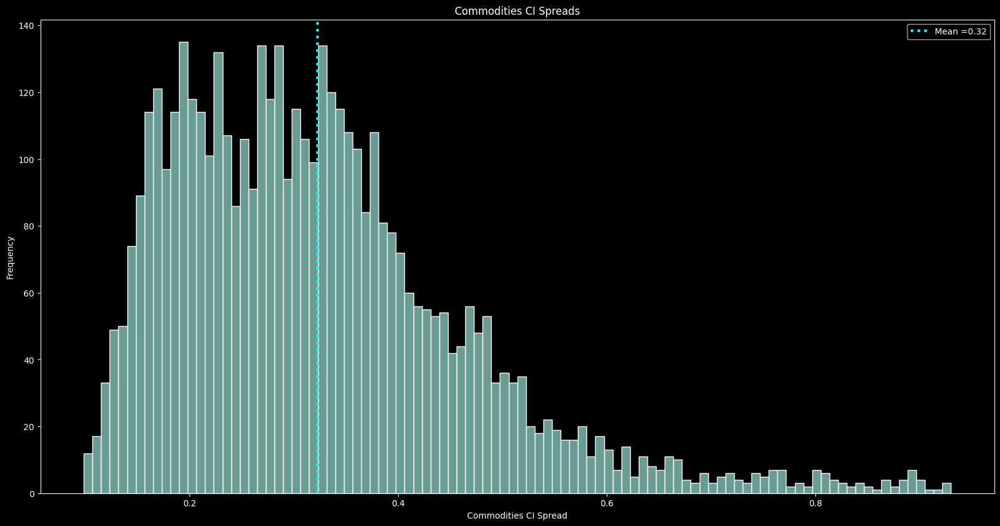

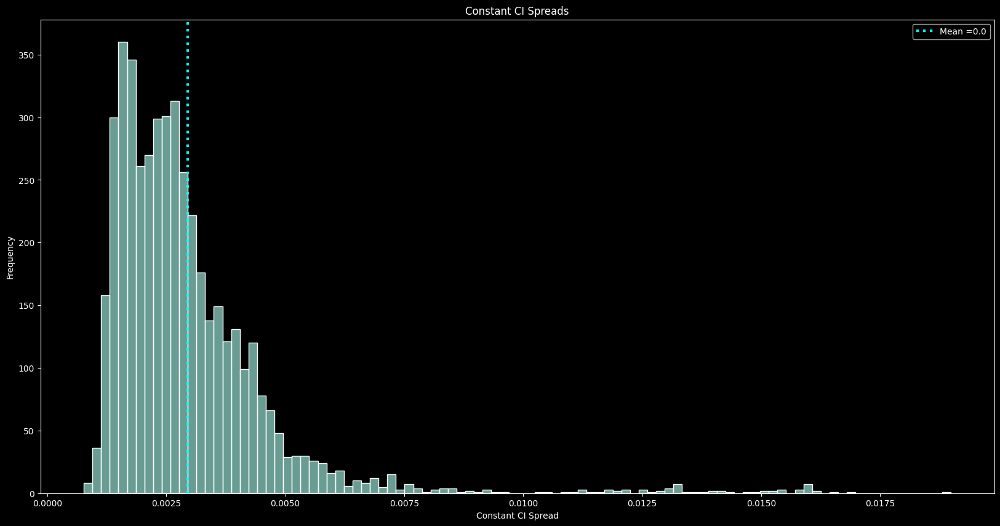

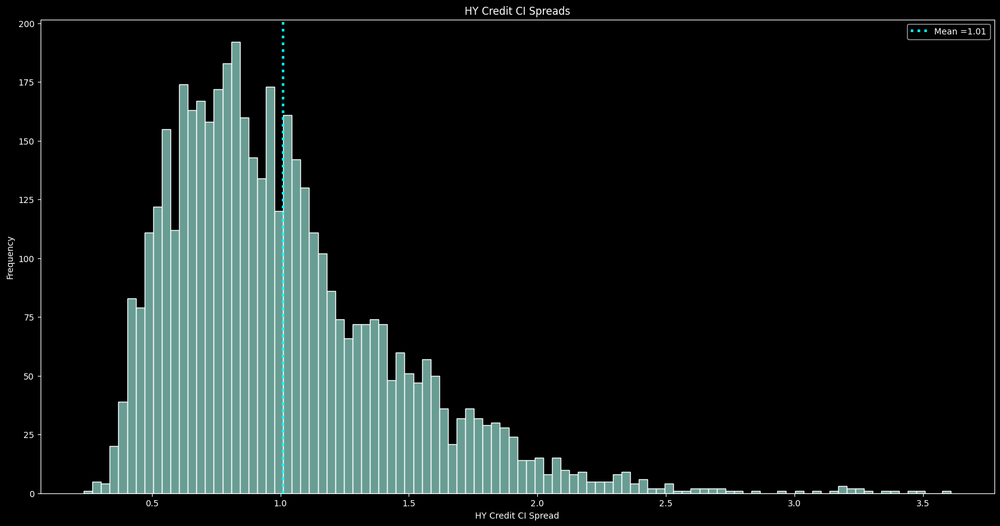

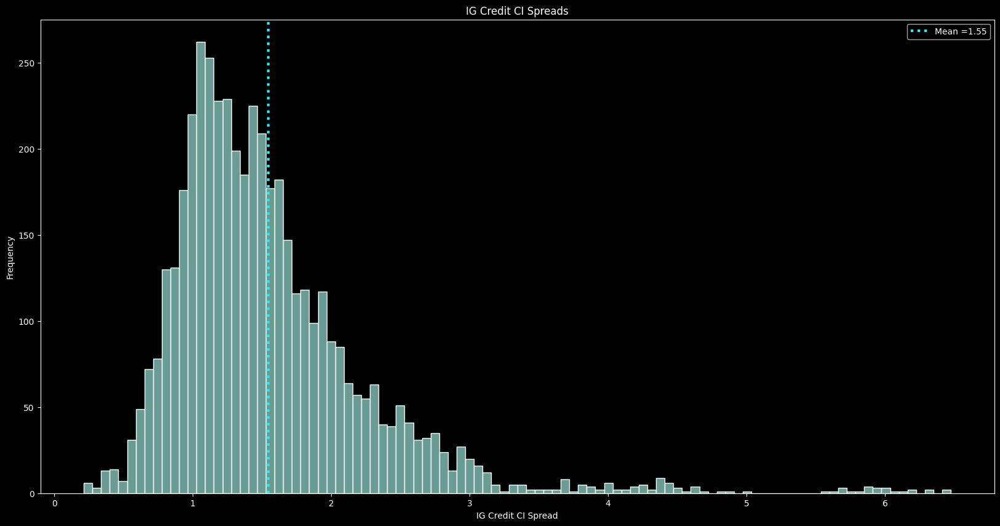

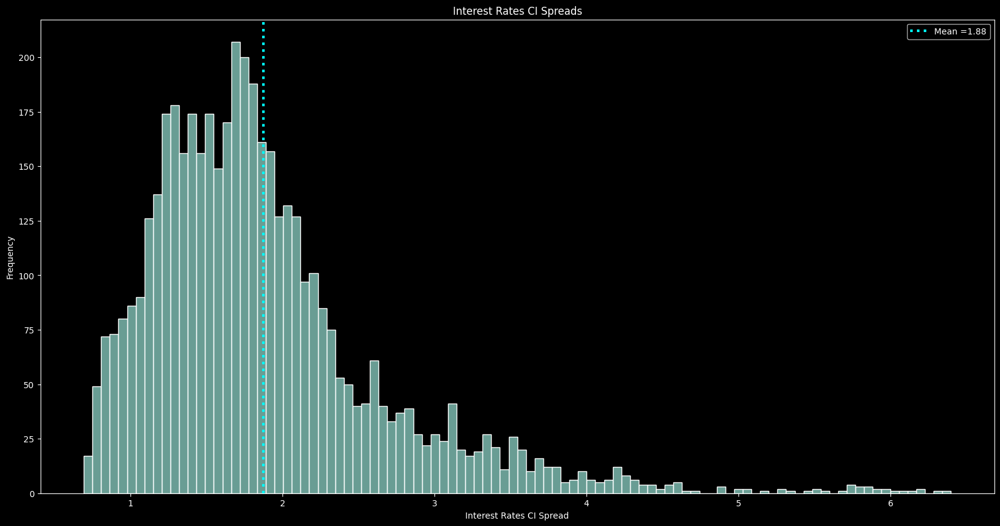

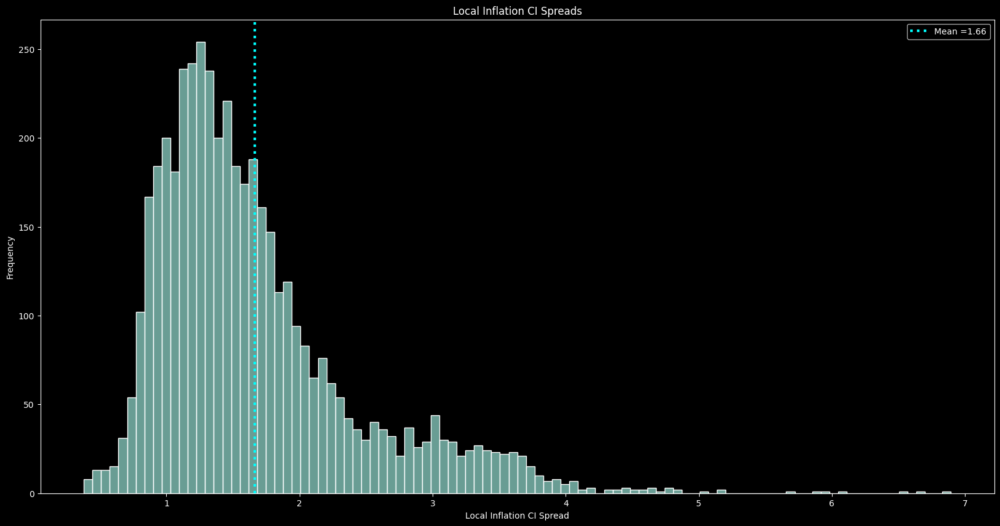

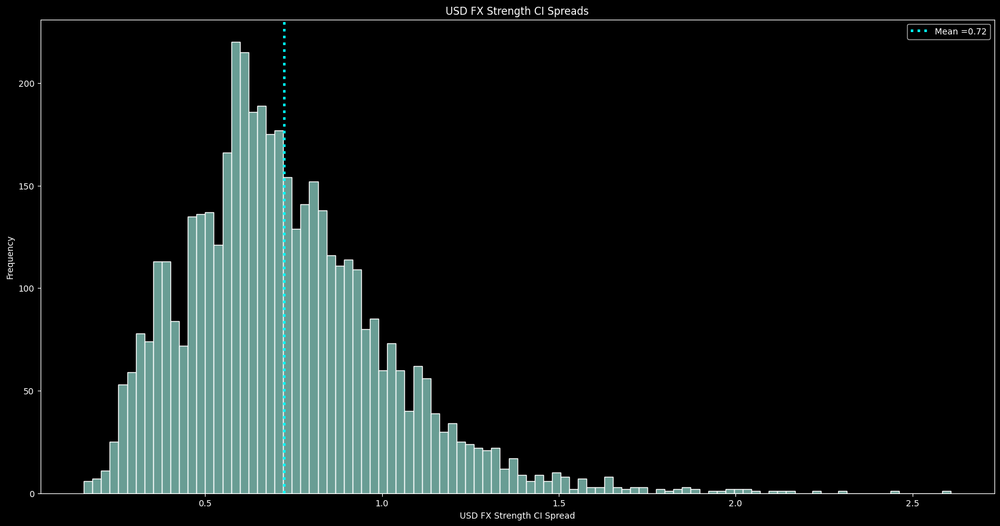

In [128]:
ci_spread = ci_upper - ci_lower

for col in ci_spread:
    plt.figure(figsize=(20,10))
    sns.histplot(ci_spread[col], bins=100)
    
    plt.axvline(ci_spread[col].mean(), color="cyan", linestyle=":", linewidth=3, label=f'Mean ={ci_spread[col].mean().round(2)}')
    
    plt.xlabel(f'{col} CI Spread')
    plt.ylabel('Frequency')
    plt.legend()
    plt.title(f'{col} CI Spreads')
    
plt.show()

### Confidence Interval Spreads across time:
I think this is a great visualization as it effectively displays the certainty of our betas across time, when we see large spikes, it implies times of high uncertainty in our model, which could later prove to be a feature in the regime model, as we can tell that these spreads are actively different across time. 

I noticed that the constant actually does a fantastic job at depicting when the crisis events happen.

Something to consider is that quite frequently we have seen beta instability around the late 2015 mark, perhaps this is something to be investigated. 

#### Late 2015 explanation:
It turns out there was some slight market turbulence in the US towards the end of 2015. If we look at the raw ETF prices against the VIX from earlier, we can get some basic insight into what happened. Notably the VIX was quite high at this point which supports our suggestion of uncertainty. 

Intuitively at this time China was in a recession which caused a shock to the markets, we should make a note of this turbulent time to see if our regime model can distinguish it from a US recession/crisis.


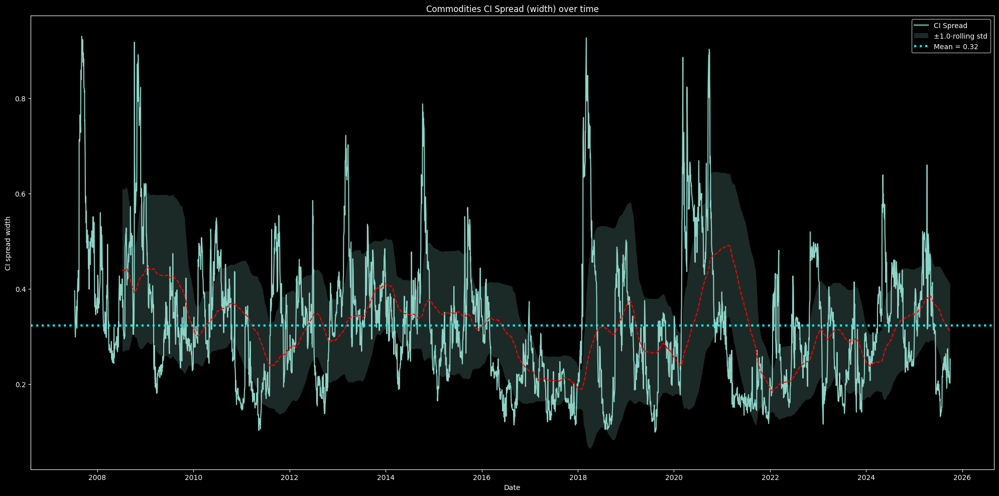

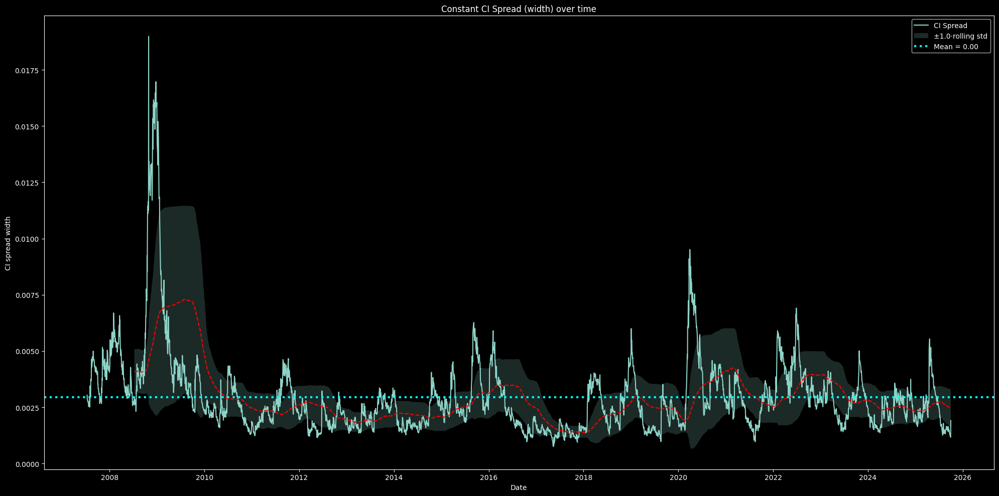

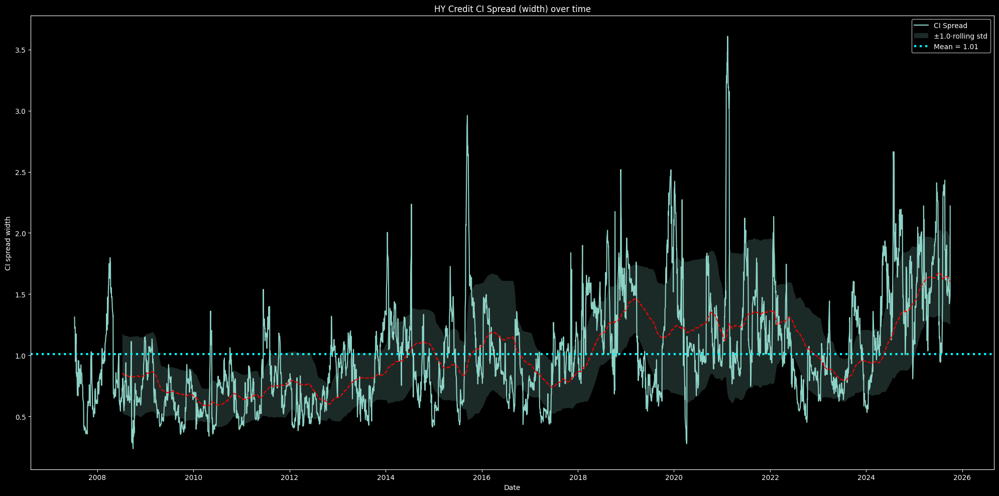

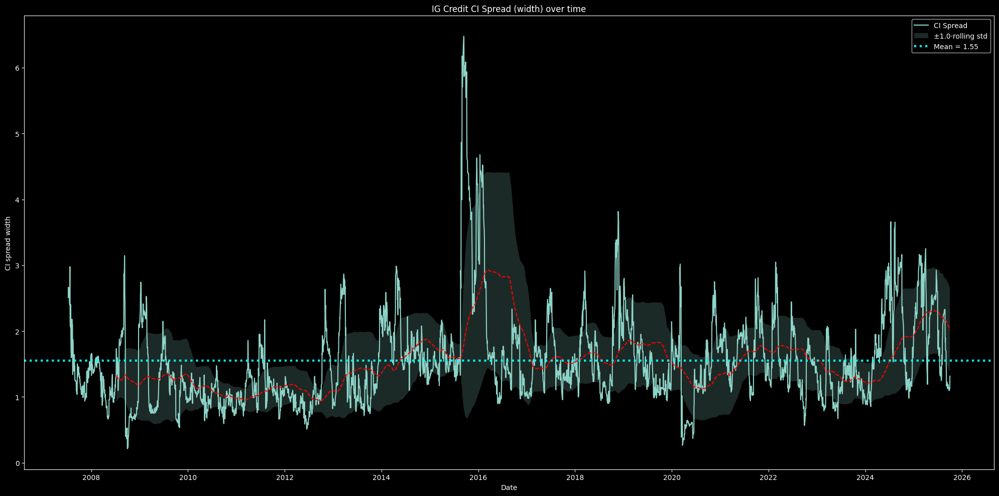

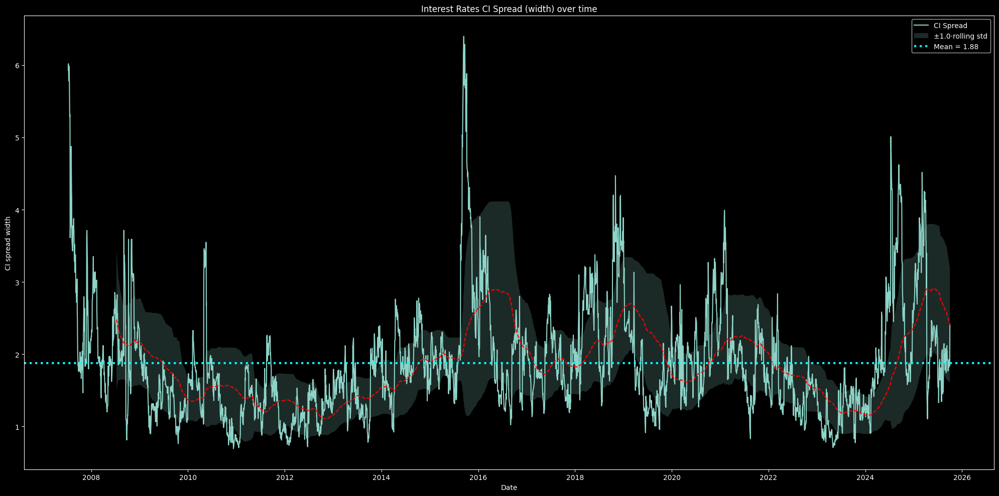

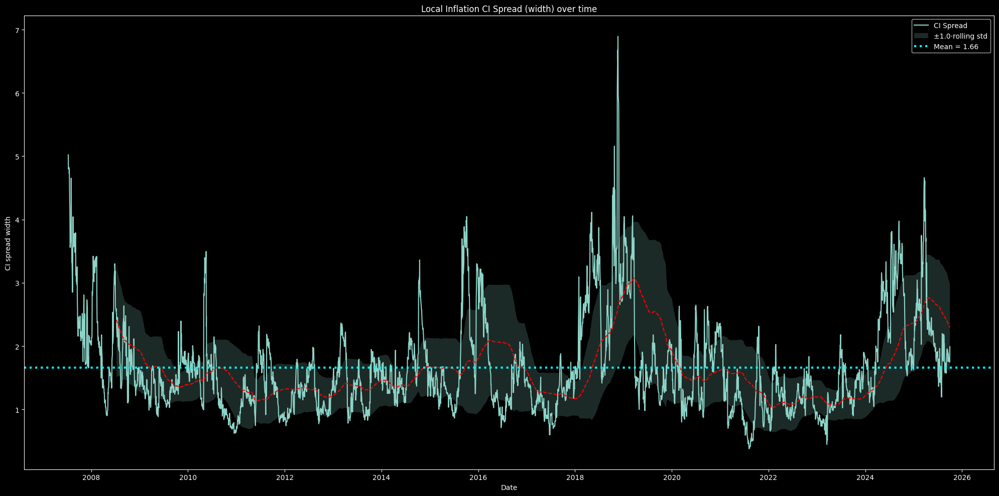

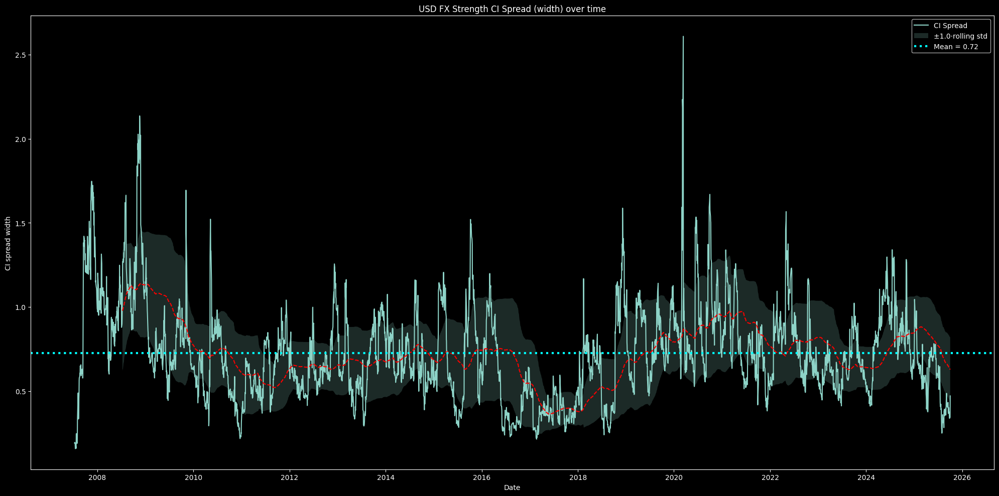

In [129]:
for col in ci_spread.columns:                 # be explicit
    s = ci_spread[col].dropna()               # this factor's spread series

    plt.figure(figsize=(20, 10))
    plt.plot(s.index, s, label='CI Spread')

    # rolling mean and std
    ci_ma  = s.rolling(window=252).mean()
    ci_std = s.rolling(window=252).std()

    # choose 1σ band (or use 1.96 * ci_std for ~95% band)
    k = 1.0
    upper = ci_ma + k * ci_std
    lower = ci_ma - k * ci_std

    # fill_between needs aligned x and y1,y2
    plt.fill_between(ci_ma.index, upper, lower, alpha=0.2, label=f'±{k}·rolling std')


    plt.plot(ci_ma, color='red', linestyle='--')
    # reference lines
    plt.axhline(s.mean(), color="cyan", linestyle=":", linewidth=3,
                label=f'Mean = {s.mean():.2f}')

    plt.title(f'{col} CI Spread (width) over time')
    plt.xlabel('Date')
    plt.ylabel('CI spread width')
    plt.legend()
    plt.tight_layout()
    plt.show()


### Confidence Interval Spread Cumulative Distribution Function


To gain further insight into how this certainty metric is behaving, we can plot it as a cumulative distribution function (CDF) instead of a histogram. This will allow us to comparatively see where the bandwidths are centered relatively. 

From this inference we, would suggest that the Commodities Factor is the highest 'certainty' of betas with interest rates being the opposite.  

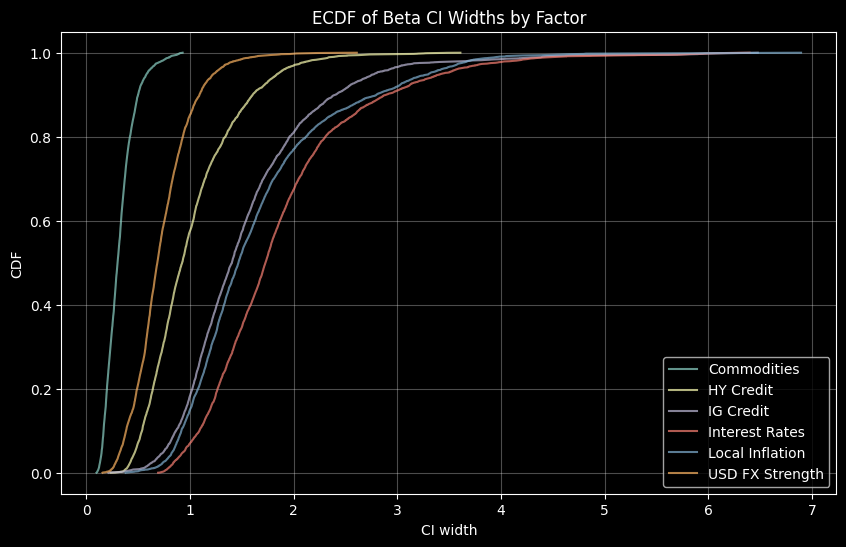

In [130]:

width = (ci_upper - ci_lower)
width.drop(columns='Constant', inplace=True)


def ecdf(x: np.ndarray):
    x = x[~np.isnan(x)]
    x_sorted = np.sort(x)
    y = np.arange(1, len(x_sorted)+1) / len(x_sorted)
    return x_sorted, y

plt.figure(figsize=(10,6))
for col in width.columns:
    x, y = ecdf(width[col].values)
    plt.plot(x, y, alpha=0.7, label=col)
plt.xlabel("CI width")
plt.ylabel("CDF")
plt.title("ECDF of Beta CI Widths by Factor")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### Cross Correlation


Mostly our residualization seemed to prove somewhat effective, albeit not entirely effective, we can see here that we still have some entangled factors, with the strongest being HY Credit and US equity, and Interest Rates with local inflation. 

If we compare this matrix to the original correlation matrix of our factor proxies we can see that a portion of the factors have been inverted. However, besides a few correlation pairs, we can say that our factor correlations are more orthogonal than our raw clusters meaning we were somewhat successful here, although we can still see some structure amongst certain pairs. 

Given that the original correlation between HY and IG credit loaded postively, then when we residualized, it shifted to a negative correlation, the flip could suggest that both these factors shared some kind of common driver which was stripped in the residualization (maybe this was opposing credit factor itself) this means that all that remains is their idiosyncratic differences which seemingly naturally move in opposite ways. Keeping this information in mind, it is suggestive that we should consider using PCA on both credit factors instead of treating them as two seperate features. 

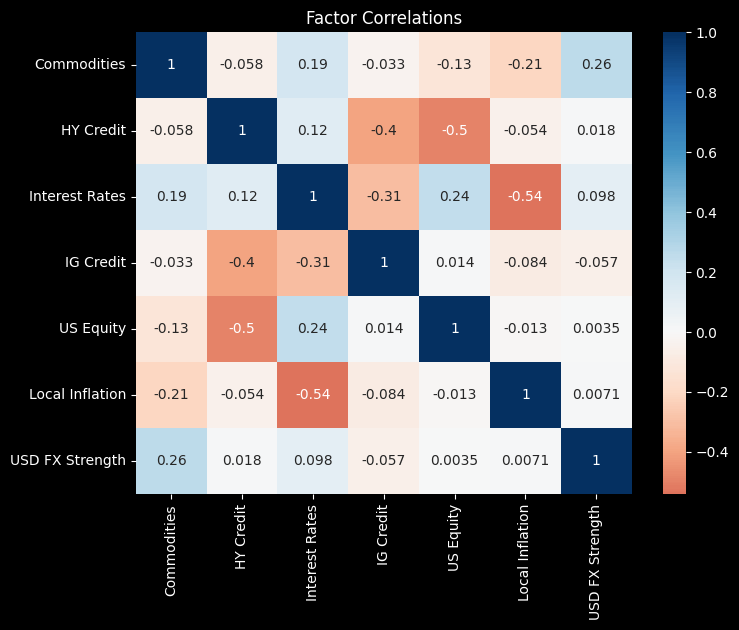

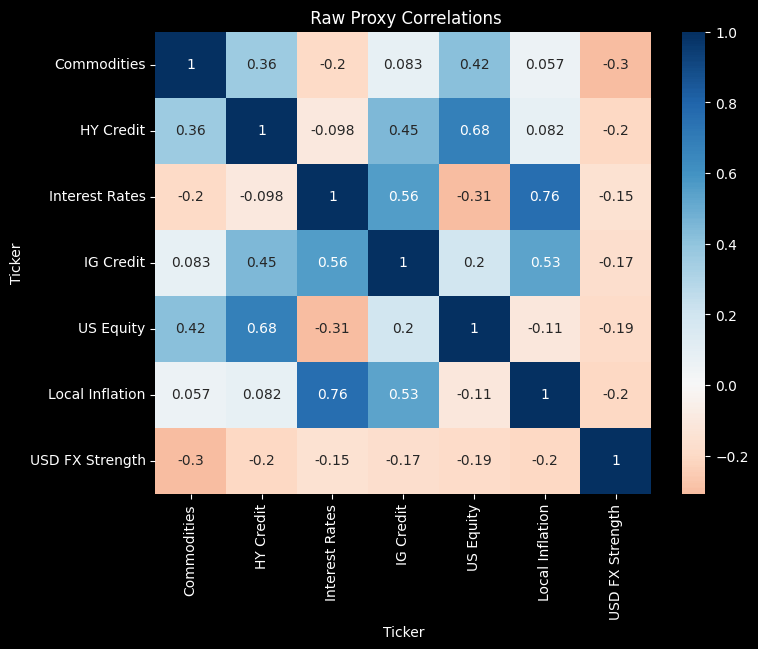

In [131]:
plt.figure(figsize=(8,6))
sns.heatmap(residuals.corr(), cmap='RdBu', center=0, annot=True)
plt.title("Factor Correlations")
plt.show()


plt.figure(figsize=(8,6))
sns.heatmap(rets_1d.corr(), cmap='RdBu', center=0, annot=True)
plt.title(" Raw Proxy Correlations")
plt.show()


#### Rolling Correlation


Looking at the correlations in a rolling window, we cannot visualize regime shifts like we were able to in the original correlation analysis. We can see the spread of factor correlations is relatively consistent, and the majority of these factors seemingly oscillating around zero which is desired. 

However, HY has a persisitent inverse correlation with equities which likely reflects shared exposure to risk premiums. Interest rates show simialr behaviour which could potentially have something to do with the discount rate.  I do not necesarily think this is a bad thing, it is more a sign of fundamentals of the markets being linked.

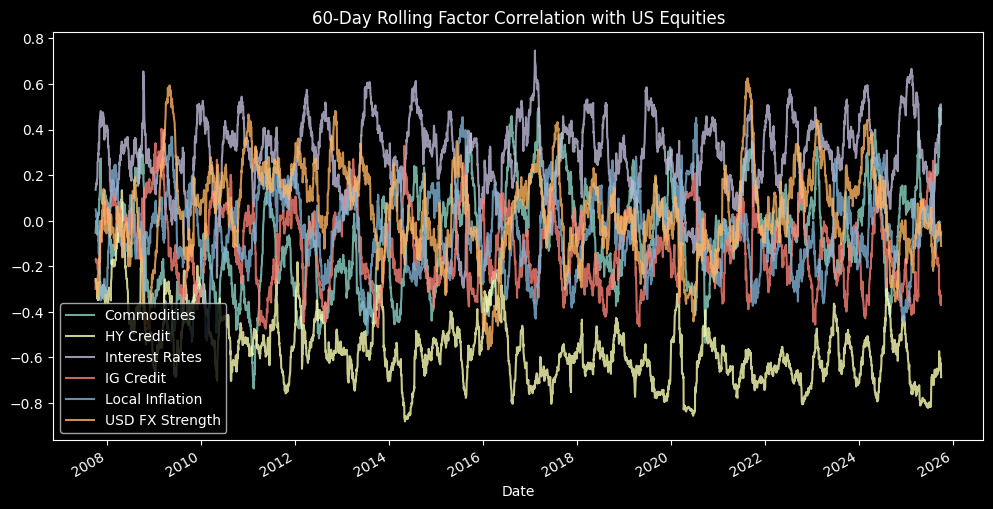

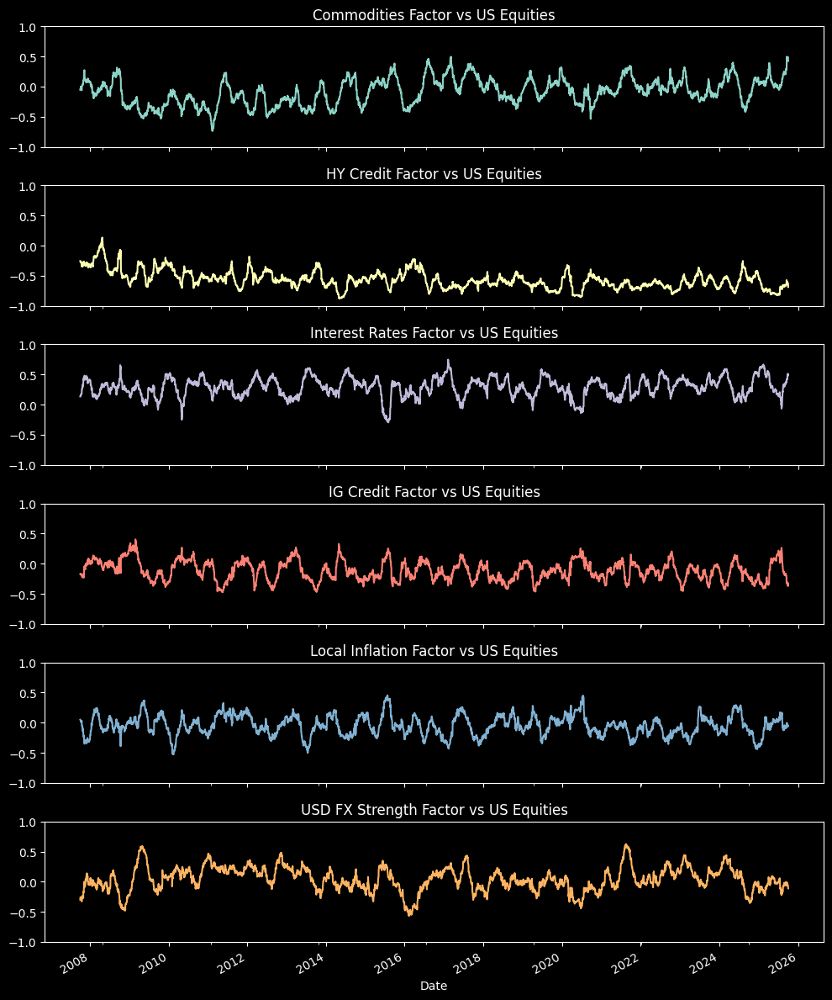

HY Credit          0.968164
Interest Rates     0.712386
Commodities        0.419320
IG Credit          0.362407
USD FX Strength    0.300044
Local Inflation    0.245312
dtype: float64

In [132]:
window = 60
roll_corrs = residuals.rolling(window).corr(residuals['US Equity'])

# Get default color cycle
color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
color_map = {col: color_cycle[i % len(color_cycle)] 
             for i, col in enumerate(residuals.columns.drop('US Equity'))}

# Combined plot
plt.figure(figsize=(12,6))
for col in residuals.columns.drop('US Equity'):
    roll_corrs.loc[:, col].plot(label=col, alpha=0.8, color=color_map[col])
plt.title(f"{window}-Day Rolling Factor Correlation with US Equities")
plt.legend()
plt.show()

# Faceted plot to see individual behavior
fig, axes = plt.subplots(len(residuals.columns)-1, 1, figsize=(10,12), sharex=True)
for ax, col in zip(axes, residuals.columns.drop('US Equity')):
    roll_corrs.loc[:, col].plot(ax=ax, color=color_map[col])
    ax.set_title(f"{col} Factor vs US Equities")
    ax.set_ylim(-1, 1)
plt.tight_layout()
plt.show()


(roll_corrs.abs() > 0.2).mean().drop('US Equity').sort_values(ascending=False)

### PCA 

Next we want to see which of our feature set is actually necessary, perhaps we can reduce the factors to be lower dimensional, this could help us grasp a deeper understanding, if we understand what the principal components actually are. 


----------------------------
We see that the first 4 PCs make up over 80% of the variance. PCs 5 and 6 bump the variance up to around 95%, where the remaining 5% comes from PC7. 

As a rule of thumb, we tend to use the 'elbow method' to determine which PCs we can drop. We can also try the 95% rule, which would mean we drop PC6 only.

This means our options are as follows:
- Use PCs 1-4 - These PCs are evidently the most informative, where each of which explains at least 20% variance, these features are clearly very important

- Use PCs 1-5 - PC 5 seems to be where the variance explained really starts to diminish, we can get a slightly more amount of explained variance in exchange for an extra dimension.

- Use PCs 1-6 - Technically this would be the only constraint which would satisfy the 95% rule so perhaps this could be used. 

I think what we can do is select all of these, turn them into dataframes and backtest them in our regime model.  

To investigate further we will have to observe the factor loadings to see what weights PCA is providing the feature set. Perhaps if we do not understand what a PC does intuitively we can consider it redundant.  

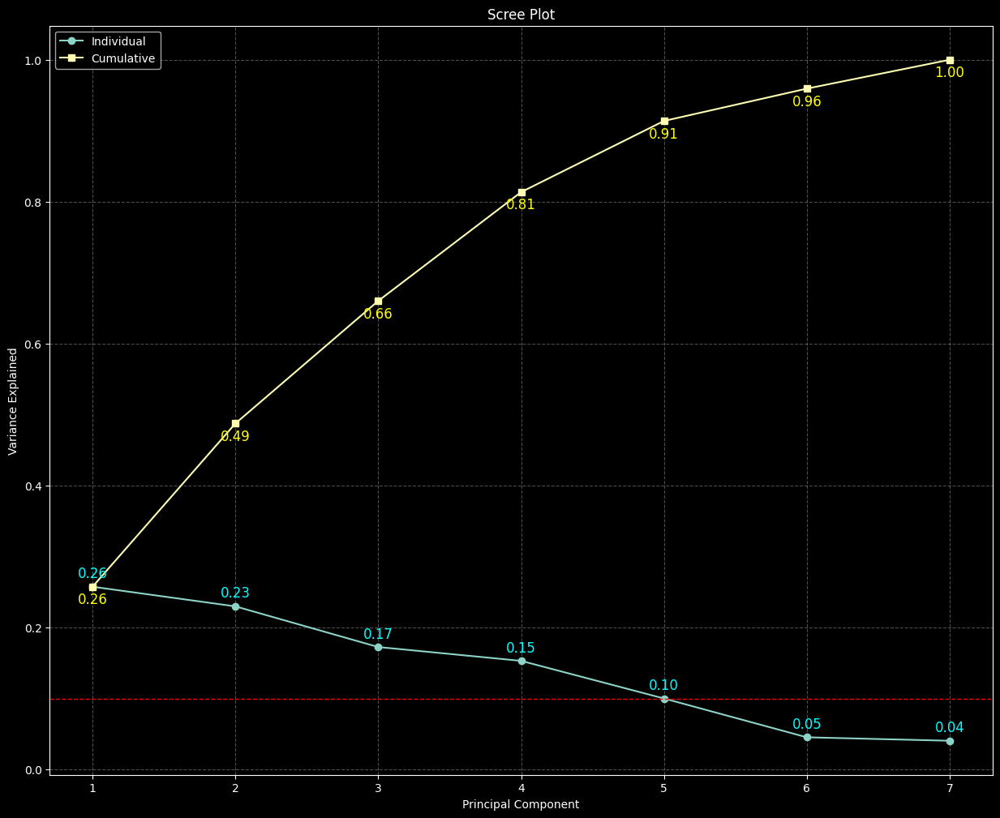

In [133]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize residuals (important for PCA)
X = StandardScaler().fit_transform(residuals)

# Fit PCA
pca = PCA().fit(X)

# Explained variance from PCA
explained = pca.explained_variance_ratio_

plt.figure(figsize=(15,12))
plt.style.use('dark_background')
plt.plot(np.arange(1, len(explained)+1), explained, "o-", label="Individual")
plt.plot(np.arange(1, len(explained)+1), explained.cumsum(), "s-", label="Cumulative")

# Individual variance explained
for i, v in enumerate(explained, 1):
    plt.annotate(f"{v:.2f}", (i, v), 
                 textcoords="offset points", 
                 xytext=(0, 8), ha='center', fontsize=12, color='cyan')

# Cumulative variance explained
for i, v in enumerate(explained.cumsum(), 1):
    plt.annotate(f"{v:.2f}", (i, v), 
                 textcoords="offset points", 
                 xytext=(0, -15), ha='center', fontsize=12, color="yellow")

plt.axhline(0.1, color="red", ls="--", lw=1)  # reference line at 10%
plt.xlabel("Principal Component")
plt.ylabel("Variance Explained")
plt.title("Scree Plot")
plt.legend()
plt.grid(True,linestyle='--',alpha=0.3)
plt.show()


Looking at these PCAs we can get some intuition as to what they actually mean.  

It can be at times difficult to label PCs even though we can see the weights, perhaps we can imply what a PC could be but we should always take it with a grain of salt. I am going to suggest what the PCs could be based on what the weights are although they could be wrong:

- PC1 - Macroeconomic Risk Premium
- PC2 - Equity vs Credit
- PC3 - USD Strength & Commodities combined (interesting point here is that both of these had the largest residual bandwidth on average
- PC4 - USD & Inflation
- PC5 - Pure Combined Credit Factor?
- PC6 - Reject, probably noise 


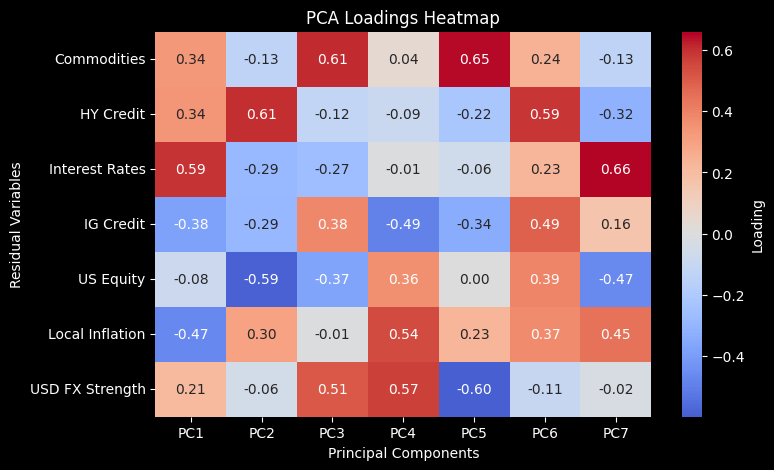

In [134]:
# Loadings = eigenvectors scaled by sqrt of eigenvalues
loadings = pd.DataFrame(
    pca.components_.T,  # transpose so rows = variables, cols = PCs
    index=residuals.columns,
    columns=[f"PC{i+1}" for i in range(pca.n_components_)]
)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,5))
plt.style.use('dark_background')
sns.heatmap(
    loadings, 
    annot=True, fmt=".2f", cmap="coolwarm", center=0,
    cbar_kws={'label': 'Loading'}
)
plt.title("PCA Loadings Heatmap")
plt.ylabel("Residual Variables")
plt.xlabel("Principal Components")
plt.show()


Looking at the PCs across time we can see that actually they are structurally quite similar, note this does not mean that they are similar as PCA is cross-sectional, meaning time dynamics are not taken into account. 

They may look similar but the PCs are uncorrelated. Which makes it very interesting that these shocks are consistent across the set. 

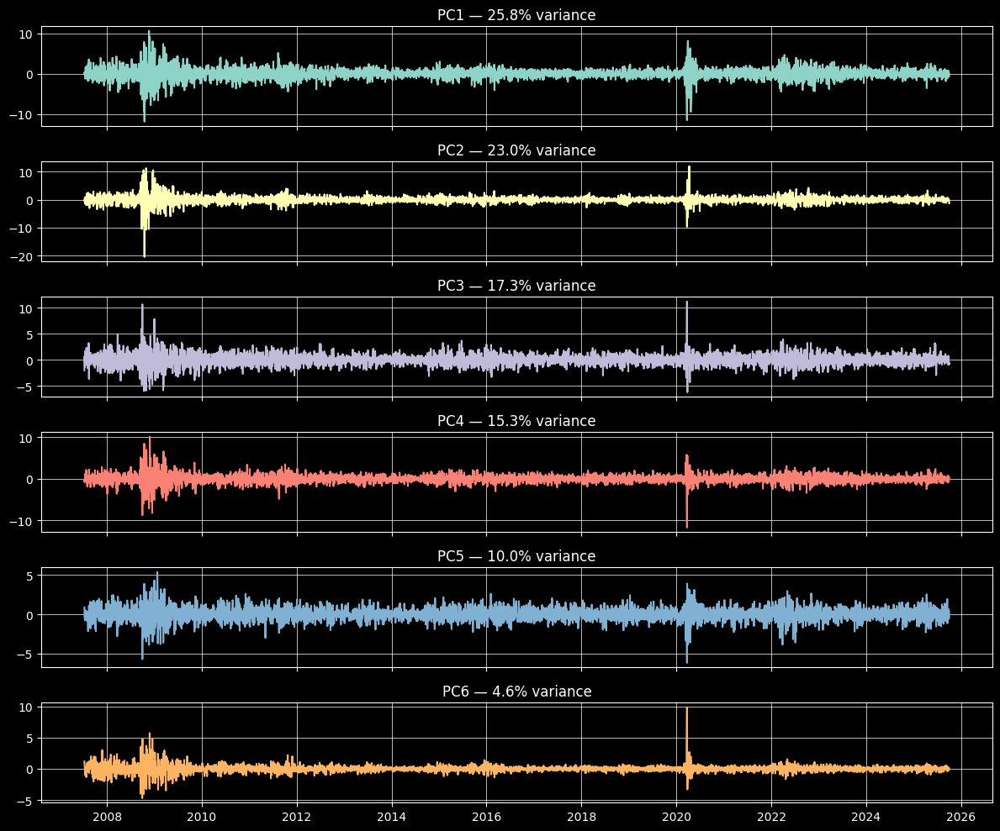

In [135]:
scores = pca.transform(X)

# get explained variance
expl = pca.explained_variance_ratio_

scores_df = pd.DataFrame(
    scores,
    index=residuals.index,
    columns=["PC1","PC2","PC3","PC4","PC5","PC6", "PC7"]
)

top_k = 6
fig, axes = plt.subplots(top_k, 1, figsize=(12,10), sharex=True)

for i in range(top_k):
    axes[i].plot(scores_df.index, scores_df.iloc[:, i], color=f"C{i}")
    axes[i].set_title(f"PC{i+1} — {expl[i]*100:.1f}% variance")
    axes[i].grid(True, linewidth=0.5)

plt.tight_layout()
plt.show()


Given that the first 3 PCs are explaining 70% variance, I thought it could be interesting to plot their behaviour into 3D space.

We see that through time the PCs tend to cluster together. My thoughts are that ths is because of our EW component in the regression. I also wish to see how these clusters change through volatility

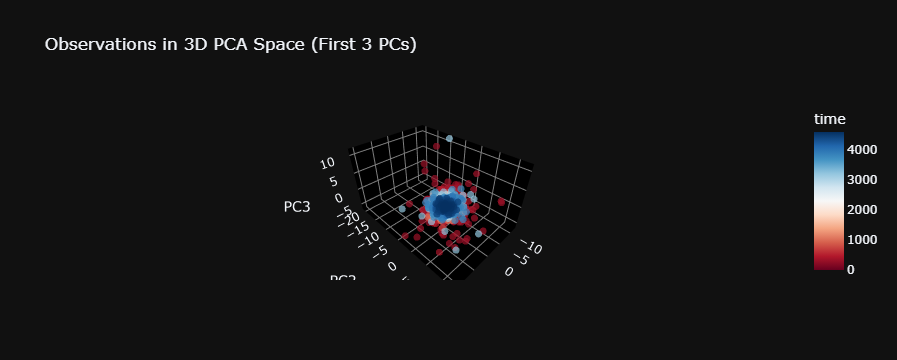

In [136]:
import plotly.express as px


scores_df["time"] = np.arange(len(scores))  # simple 0...N-1

fig = px.scatter_3d(
    scores_df,
    x="PC1", y="PC2", z="PC3",
    color="time",# smooth gradient
    color_continuous_scale='RdBu',
    title="Observations in 3D PCA Space (First 3 PCs)",
    opacity=0.7
)
fig.update_traces(marker=dict(size=4))
fig.update_layout(
    template="plotly_dark",
    scene=dict(
        xaxis=dict(backgroundcolor="black", gridcolor="gray", zerolinecolor="gray"),
        yaxis=dict(backgroundcolor="black", gridcolor="gray", zerolinecolor="gray"),
        zaxis=dict(backgroundcolor="black", gridcolor="gray", zerolinecolor="gray")
    )
)

fig.show()


We can see here that as volatility increases, the observations tend to deviate more from the cluster. This makes sense because in certain times, we can expect the factors to converge 

In [137]:
vol = rets_1d['US Equity'].rolling(60).std()
vol = vol.reindex(residuals.index)

X_std = StandardScaler().fit_transform(residuals)
pca = PCA(n_components=3).fit(X_std)
scores = pca.transform(X_std)

pc_df = pd.DataFrame(scores, index=residuals.index, columns=["PC1","PC2","PC3"])
pc_df["vol"] = vol

fig = px.scatter_3d(
    pc_df, x="PC1", y="PC2", z="PC3",
    color="vol", color_continuous_scale="Viridis",
    title="Observations in PCA Space (colored by rolling volatility)"
)
fig.update_layout(
    template="plotly_dark",
    scene=dict(
        xaxis=dict(backgroundcolor="black", gridcolor="gray", zerolinecolor="gray"),
        yaxis=dict(backgroundcolor="black", gridcolor="gray", zerolinecolor="gray"),
        zaxis=dict(backgroundcolor="black", gridcolor="gray", zerolinecolor="gray")
    )
)

fig.show()


While these 3D plots are intuitive, it would be difficult to justify using only 3 PCs in our factor model, as we would be omitting 30% variance. Simply speaking this is too much. 

I dont think this will be too much of a problem I imagine conceptually in higher dimensional space the cluster will be apparent, but may go through some kind of mitosis as the dimensions increase (thought inspired from kernel trick). 

In [138]:
scores_df.drop(columns='time', inplace=True)

In [139]:

factor_model_pcs = scores_df.rename(columns={
    "PC1": "Macro Risk Premium",
    "PC2": "Equity vs Credit",
    "PC3": "USD + Commodities",
    "PC4": "USD + Inflation",
    "PC5": "Credit Factor",
    "PC6": "Noise1?",
    "PC7": "Noise2?",
})

factor_model_pcs.head(3)

,Macro Risk Premium,Equity vs Credit,USD + Commodities,USD + Inflation,Credit Factor,Noise1?,Noise2?
Date,,,,,,,
2007-07-12,0.069192,-0.517555,-2.044162,-0.417594,0.879773,1.190411,-1.076958
2007-07-13,0.388893,0.370818,0.672196,-0.806135,-0.356510,0.780107,-0.353087
2007-07-16,-0.245225,0.127064,-1.428814,0.054429,-0.758334,-0.426689,0.268503


### PC Correlations + Original US Equity Factor

By design PCA makes the feature set orthogonal. Plotting the matrix including the original US equity factor, we can see that correlations are weak, but present, interestingly enough the only properties with a notable correlation are the noise components, which makes sense as they explain less variance, suggesting that they are closer to the original feature than others. 


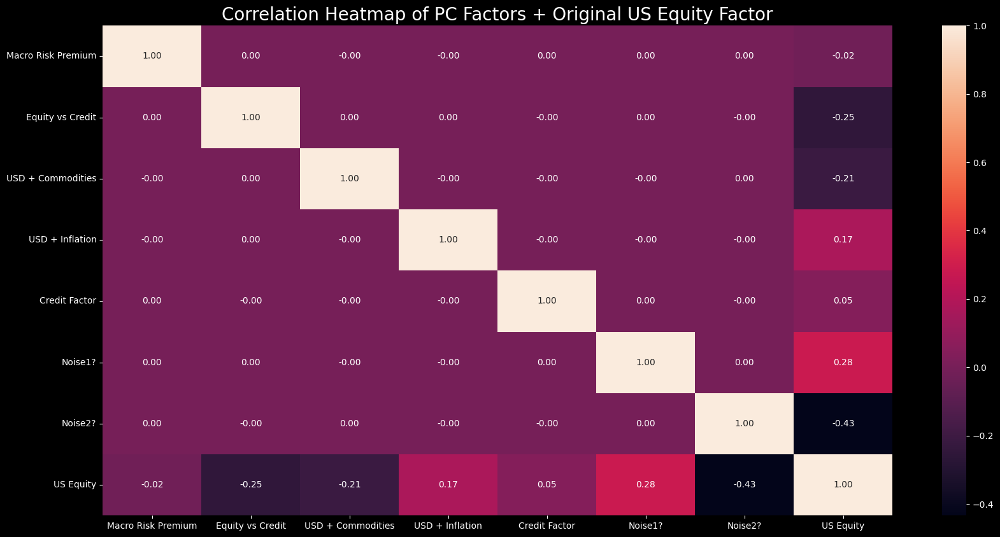

In [140]:
factor_model_pcs['US Equity'] = rets_1d['US Equity']


plt.figure(figsize=(20,10))
sns.heatmap(factor_model_pcs.corr(), annot=True, fmt='.2f')
plt.title('Correlation Heatmap of PC Factors + Original US Equity Factor',fontsize=20)
plt.show()

factor_model_pcs = factor_model_pcs.drop(columns='US Equity')


# Closing Remarks 

I am not entirely sure if this factor model will serve as a solid representation of the US Equity market. My initial hypothesis was that the US Market Regimes are simply defined by volatility and returns. This is theoretically all the things we would need to determine a 'bull','bear' or 'sideways market. 

That being said, this factor model could have the potential to make this approach slightly more comprehensive. I am expecting to see more detailed features than the simple aforementioned labels. Perhaps there are periods of 'Crisis' which is different to a period of 'stress', perhaps there are times when we should be cautious in our trading, but not necessarily be in a crisis state. 

I will save all dataframes which I think could be useful in the regime model.

Perhaps we will also try to test this factor model against a simple baseline of VIX + returns as features to represent the SPY regimes. 

## Looking Forward

I am going to use these features to make a market regime detection system. I will also make many regime models using these different datasets, and possibly make new datasets to compare the regime detections. Then I plan on doing a comprehensive backtest of all the regime models to see which one is the most effective.

### Learning:

I have learned a lot in this project, getting a hands on deep dive on building a simple model and residualizing the factors, this is an appraoch I had never considered before undertaking this project. I was also able to do a deeper dive on PCA which has greatly fortified my knowledge in this area. I also really enjoyed analyzing the data from a static and rolling standpoint, where I found interesting relationships and insights throughout. 

Looking forward to the next step.

In [141]:
# Saving Different Variations of the factor model to test in regime modeling
factor_model_pcs.to_csv("factor_model_pcs.csv")

factor_model_resids = residuals.drop(columns='US Equity')
factor_model_resids.to_csv('factor_model_resids.csv')

rets_1d.to_csv('factor_model_raw.csv')